In [334]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from importlib import reload
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from skimage.morphology import binary_opening, binary_closing, binary_opening

In [335]:
NOTEBOOK_DIR = os.getcwd()
MODULE_DIR, _ = os.path.split(NOTEBOOK_DIR)
sys.path.append(MODULE_DIR)

In [336]:
from longterm import load, utils
from longterm.utils import list_attr, list_fn, list_mthd
from longterm import analysis as an
from longterm.behaviour import synchronisation as sync
from longterm import plot as myplt
from longterm import rois
from longterm.behaviour import optic_flow as of
from longterm.analysis import InterPCAAnalysis, InterPCAAnalysisFromFile

In [337]:
fly_dirs = [os.path.join(load.NAS2_DIR_LH, "210512", "fly3"),
            os.path.join(load.NAS2_DIR_LH, "210519", "fly1"),
            os.path.join(load.NAS2_DIR_LH, "210521", "fly1"),
            os.path.join(load.NAS2_DIR_LH, "210526", "fly2"),
            os.path.join(load.NAS2_DIR_LH, "210527", "fly4"),
           
            os.path.join(load.NAS2_DIR_LH, "210602", "fly2"),
            os.path.join(load.NAS2_DIR_LH, "210603", "fly2")]
N_flies = len(fly_dirs)
pcan_dirs = [os.path.join(fly_dir, "processed", "pcan_sigma1.pkl") for fly_dir in fly_dirs]

In [338]:
pcans = [InterPCAAnalysisFromFile(pcan_dir) for pcan_dir in pcan_dirs]

loading from file:  /mnt/NAS2/LH/210512/fly3/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210519/fly1/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210521/fly1/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210526/fly2/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210527/fly4/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210602/fly2/processed/pcan_sigma1.pkl
loading from file:  /mnt/NAS2/LH/210603/fly2/processed/pcan_sigma1.pkl


In [363]:
for pcan in pcans:
    pcan.sort_neurons()
    w = pcan.get_w_inter_pca_walk_rest_neurons()
    pcan.get_covs_walk_rest_neurons()
    pcan.get_covs_inter_trial_neurons()
    pcan.get_inter_pca_trials_neurons()
    pcan.get_inter_condition_variance_ratios_neurons()
    """
    w = pcan.get_w_inter_pca_walk_rest_pixels(i_trials=[1]).reshape(pcan.size_y, -1)
    abs_im = (np.abs(w) > np.quantile(np.abs(w),0.95)).astype(np.int32)
    abs_im = binary_opening(abs_im, selem=np.ones((3,2)))
    abs_im = binary_closing(abs_im, selem=np.ones((3,2)))
    selected_pixels = abs_im.flatten()
    pcan.select_pixels(selected_pixels)
    pcan.sort_pixels()
    w = pcan.pixels_to_image(pcan.get_w_inter_pca_walk_rest_pixels())
    pcan.get_covs_walk_rest_pixels()
    pcan.get_covs_inter_trial_pixels()
    pcan.get_inter_pca_trials_pixels()
    """

In [362]:
selected_data = np.concatenate([pcans[0].neurons[i] for i in [1,3,5]])
pcans[0].neurons_mean = np.mean(selected_data, axis=0)
pcans[0].neurons_std = np.std(selected_data, axis=0)
pcans[0].neurons = [(data - pcans[0].neurons_mean) / pcans[0].neurons_std for data in pcans[0].neurons]

<IPython.core.display.Javascript object>


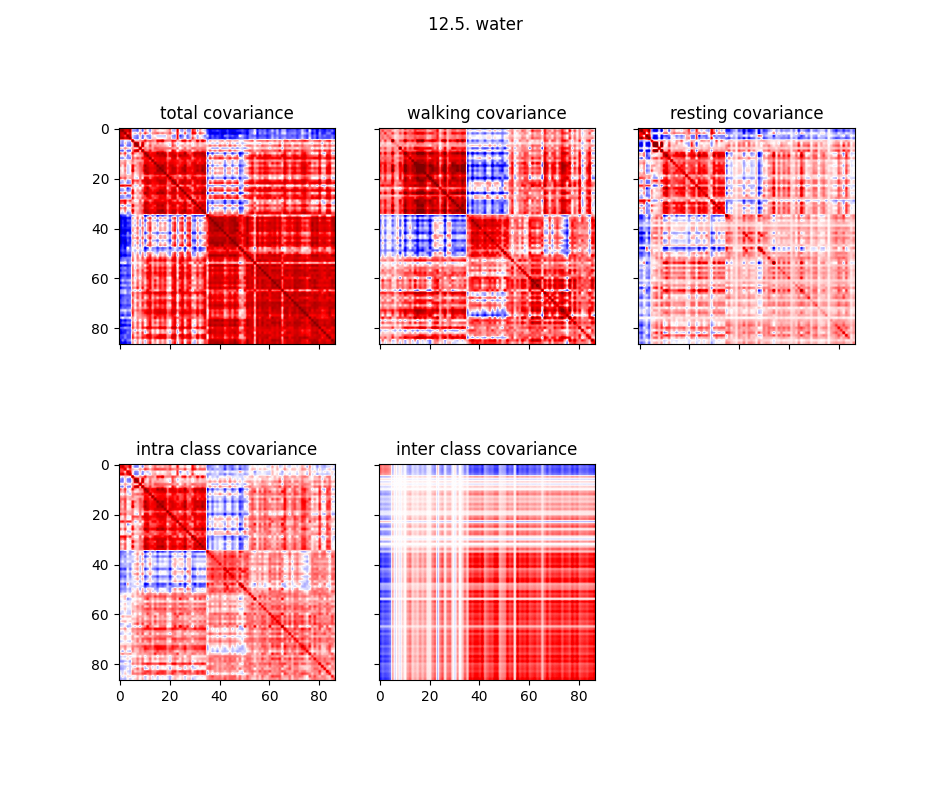

<IPython.core.display.Javascript object>


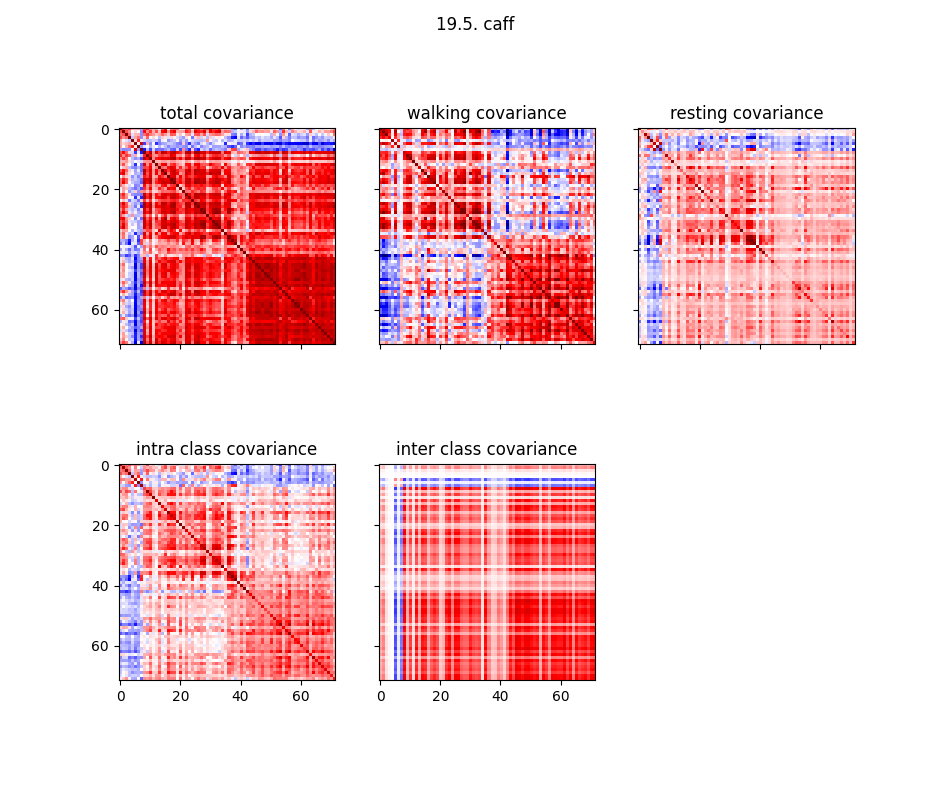

<IPython.core.display.Javascript object>


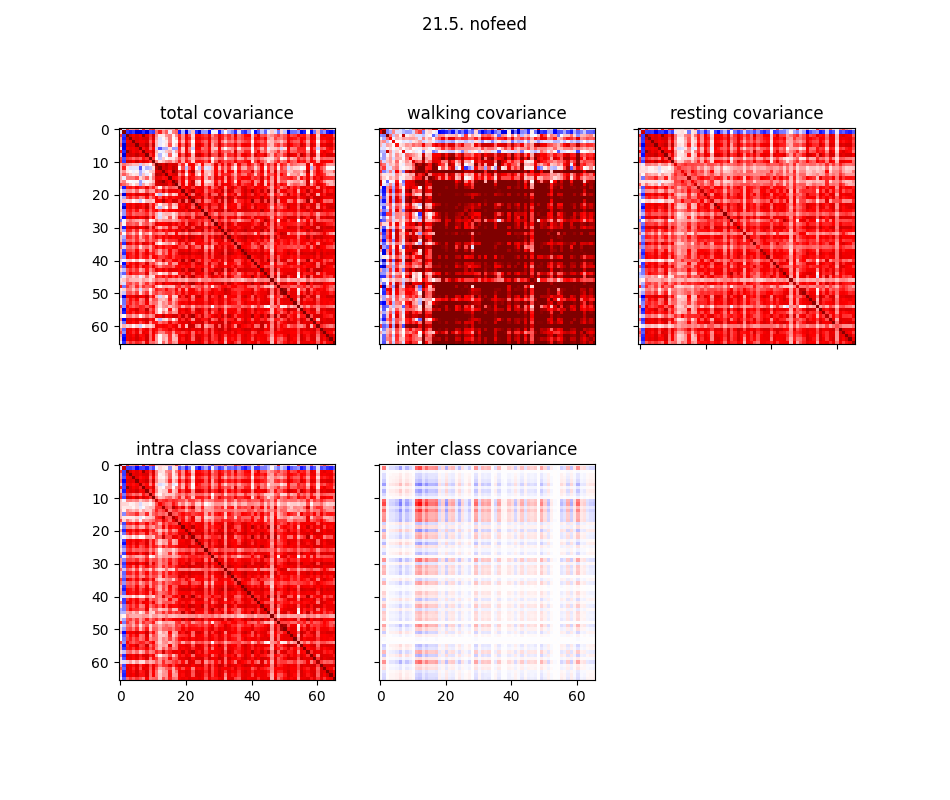

<IPython.core.display.Javascript object>


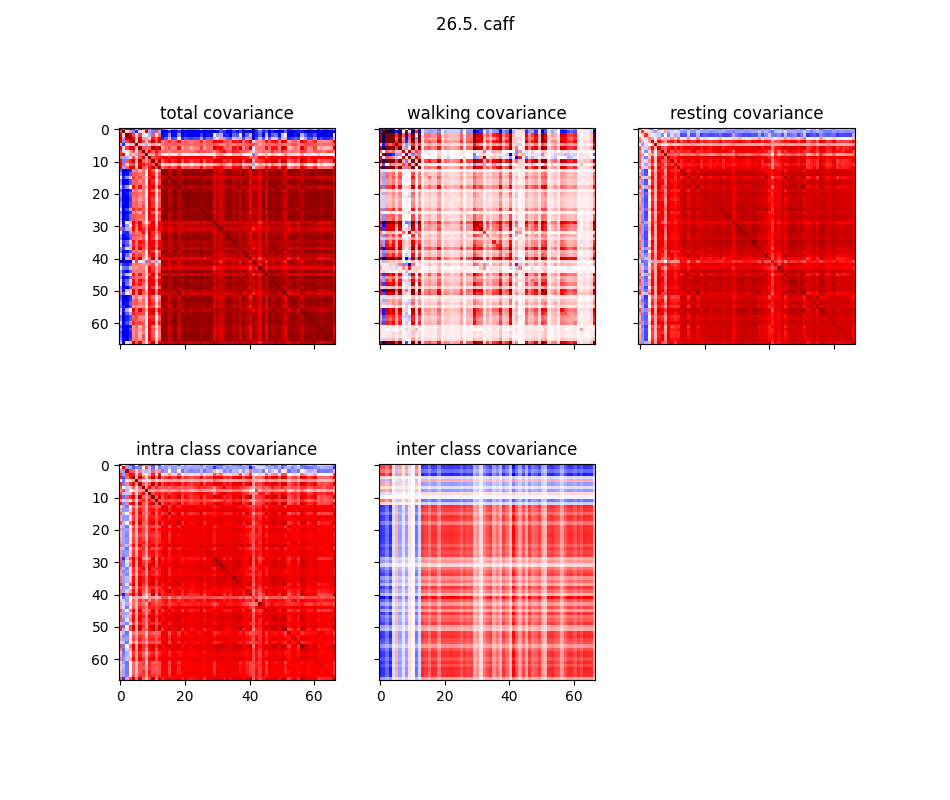

<IPython.core.display.Javascript object>


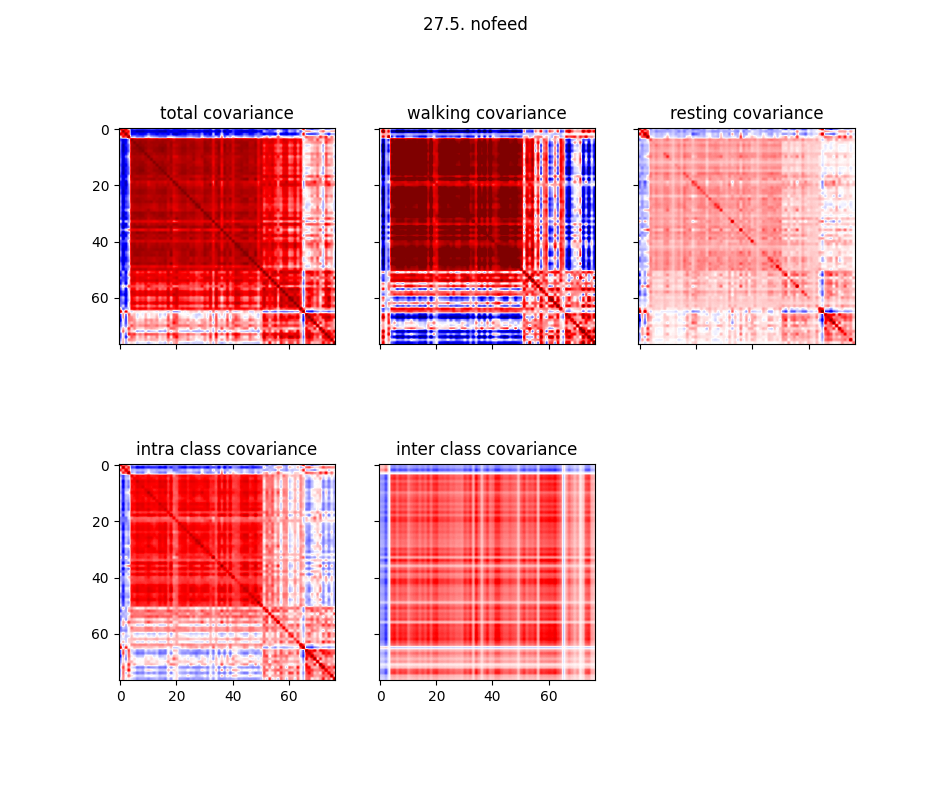

<IPython.core.display.Javascript object>


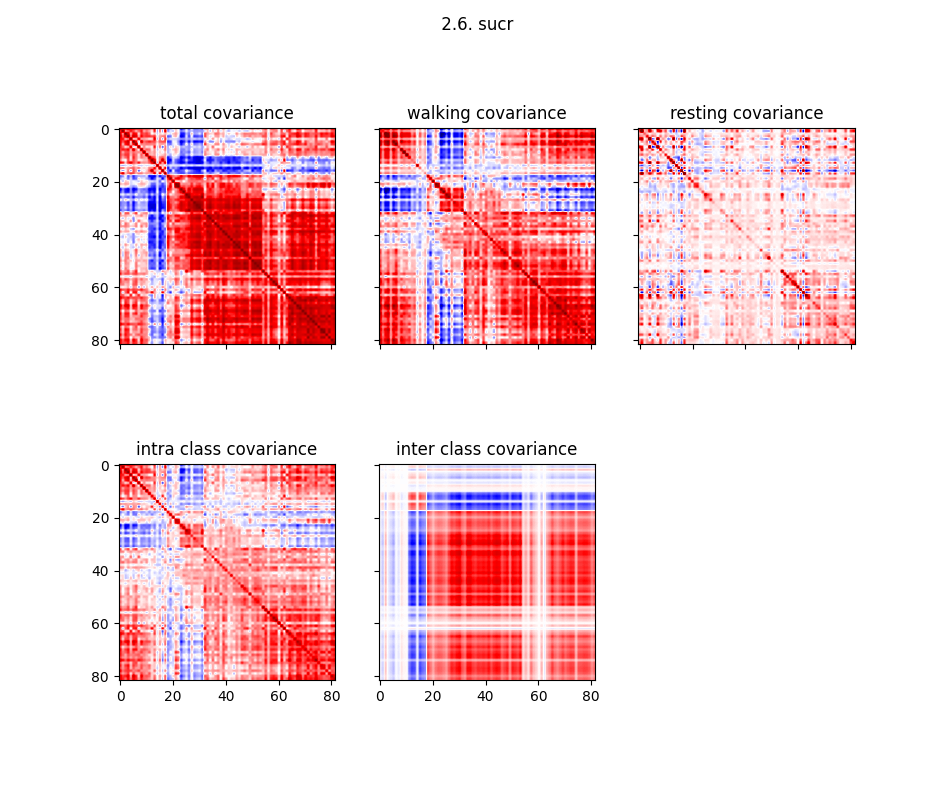

<IPython.core.display.Javascript object>


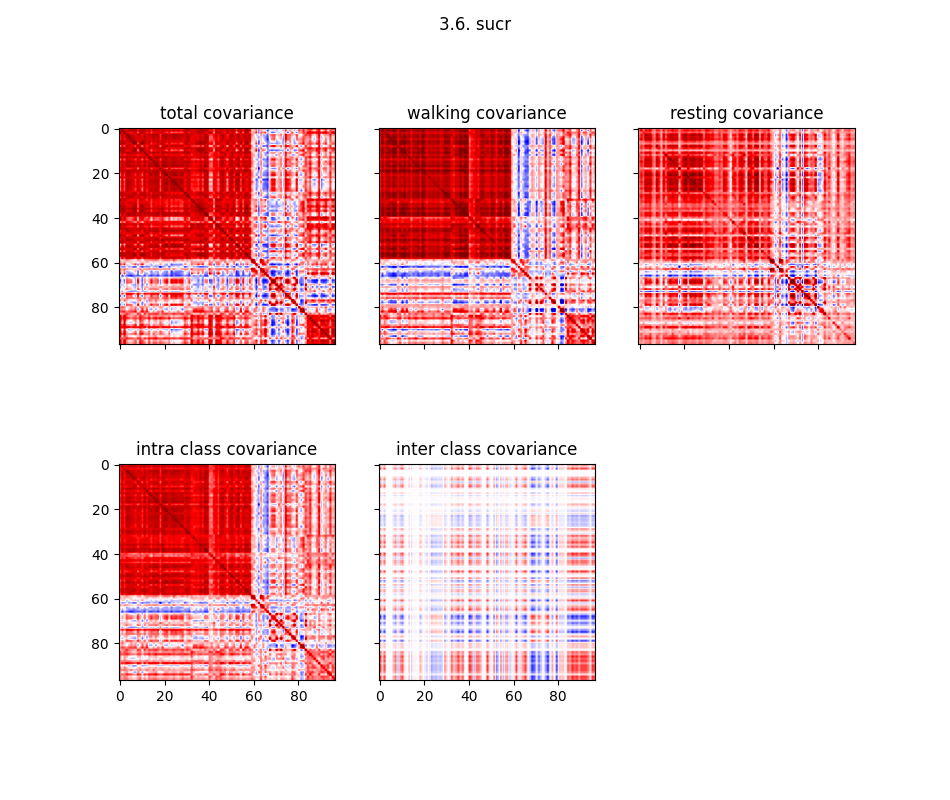

In [340]:
%matplotlib notebook

for pcan in pcans:
    fig, axs = plt.subplots(2,3,figsize=(9.5, 8), sharex=True, sharey=True)
    clim = [np.quantile(pcan.cov_neurons, 0.01), np.quantile(pcan.cov_neurons, 0.99)]
    clim = [-1,1]
    axs[0,0].imshow(pcan.cov_neurons, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,0].set_title("total covariance")
    axs[0,1].imshow(pcan.cov_neurons_walk, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,1].set_title("walking covariance")
    axs[0,2].imshow(pcan.cov_neurons_rest, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,2].set_title("resting covariance")
    axs[1,0].imshow(pcan.cov_neurons_rest_walk_intra, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,0].set_title("intra class covariance")
    axs[1,1].imshow(pcan.cov_neurons_rest_walk_inter, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,1].set_title("inter class covariance")
    axs[1,2].axis("off")
    fig.suptitle(pcan.condition)

<IPython.core.display.Javascript object>


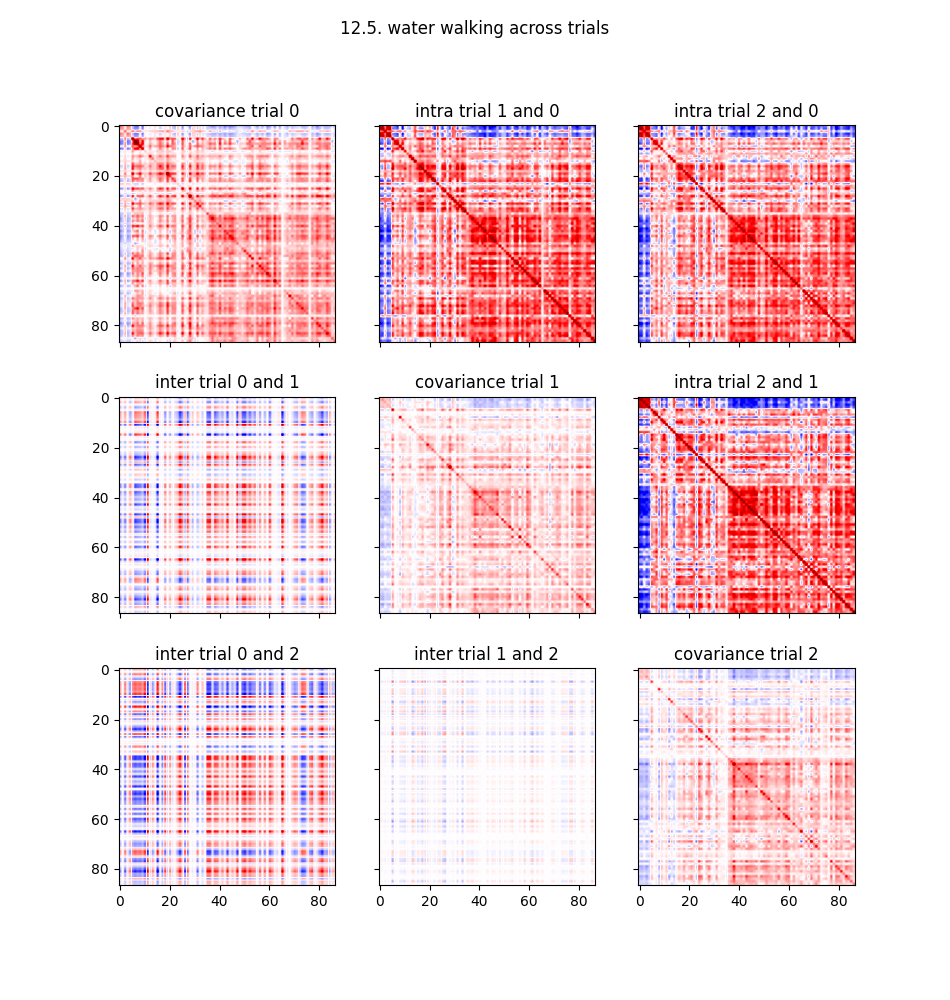

<IPython.core.display.Javascript object>


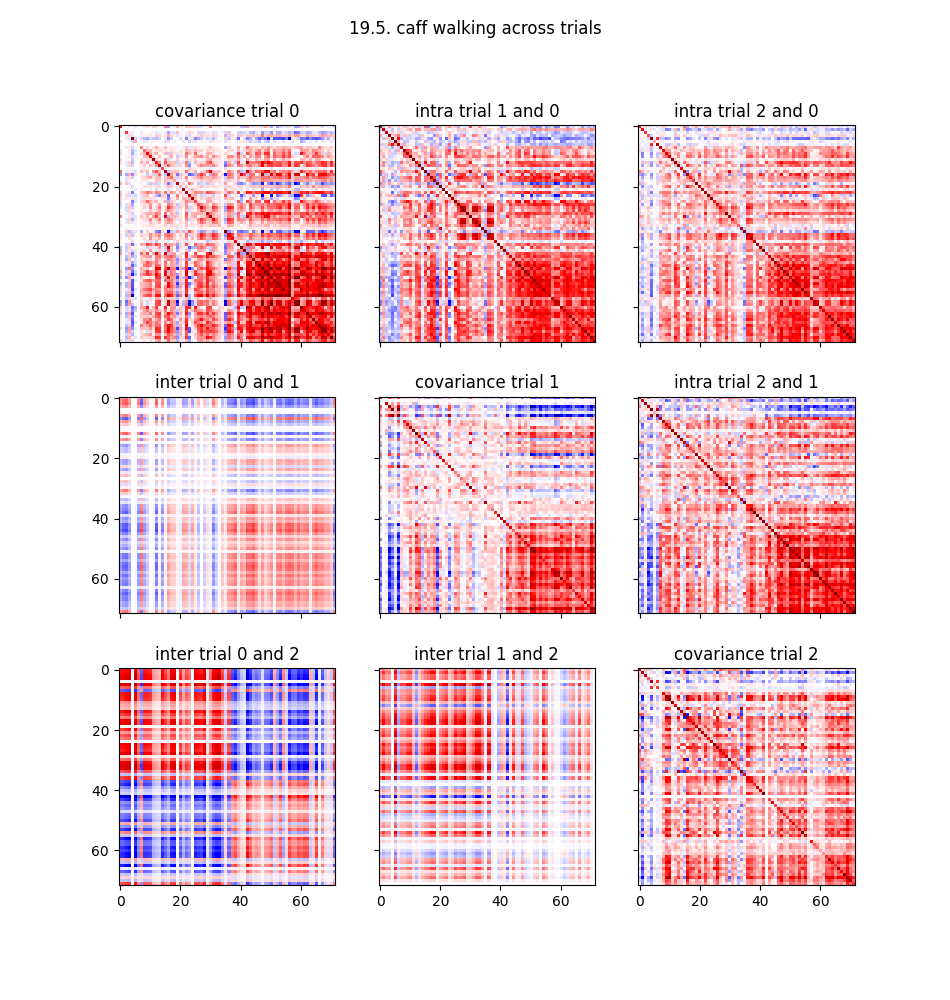

<IPython.core.display.Javascript object>


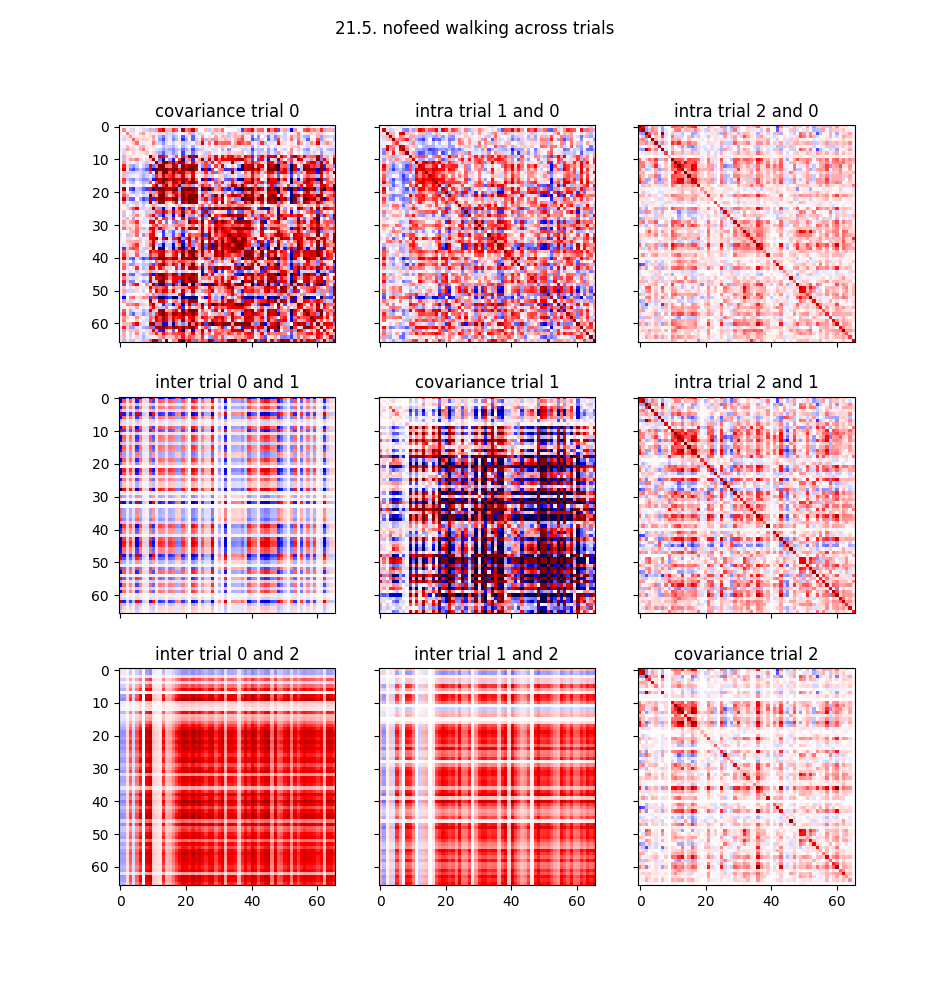

<IPython.core.display.Javascript object>


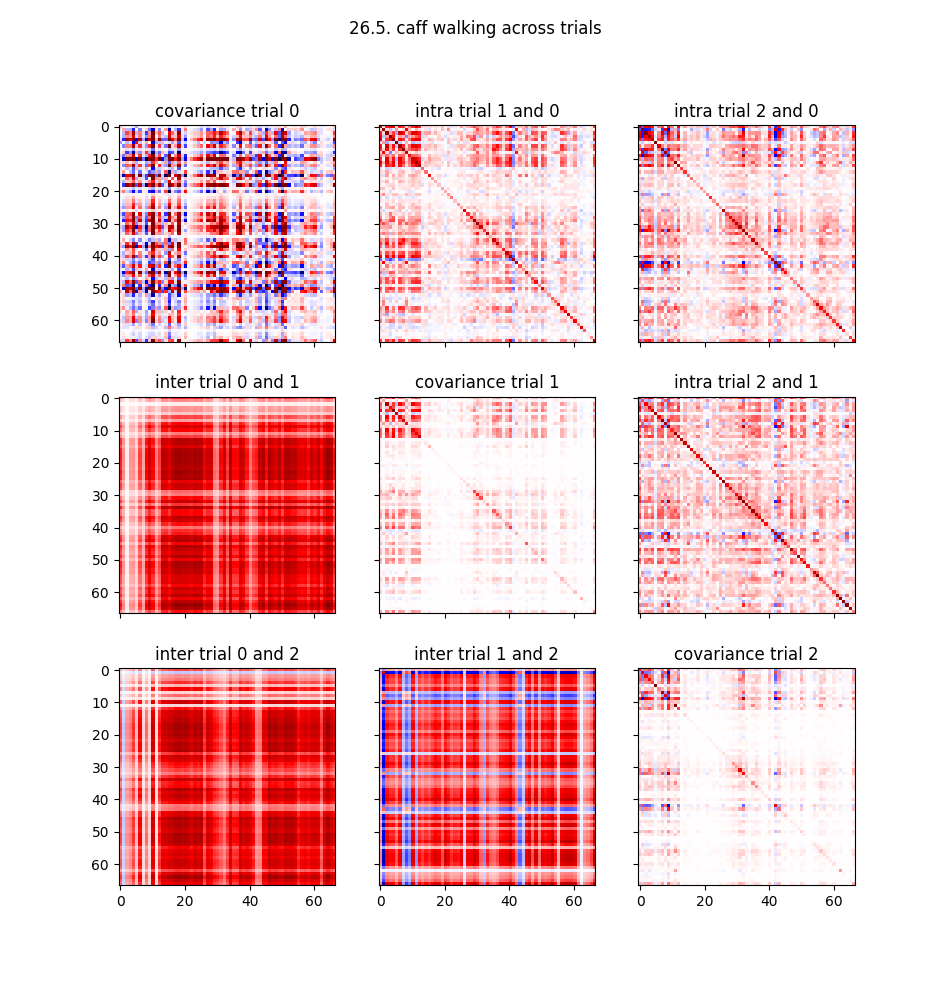

<IPython.core.display.Javascript object>


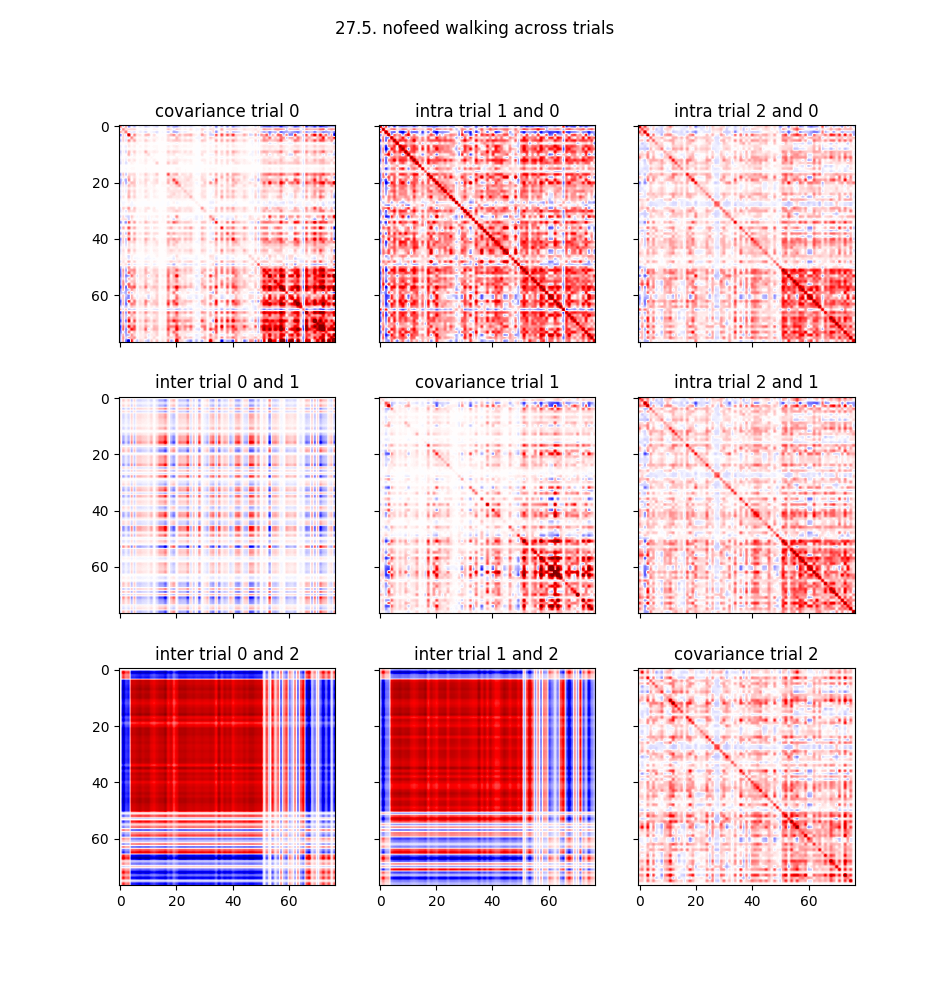

<IPython.core.display.Javascript object>


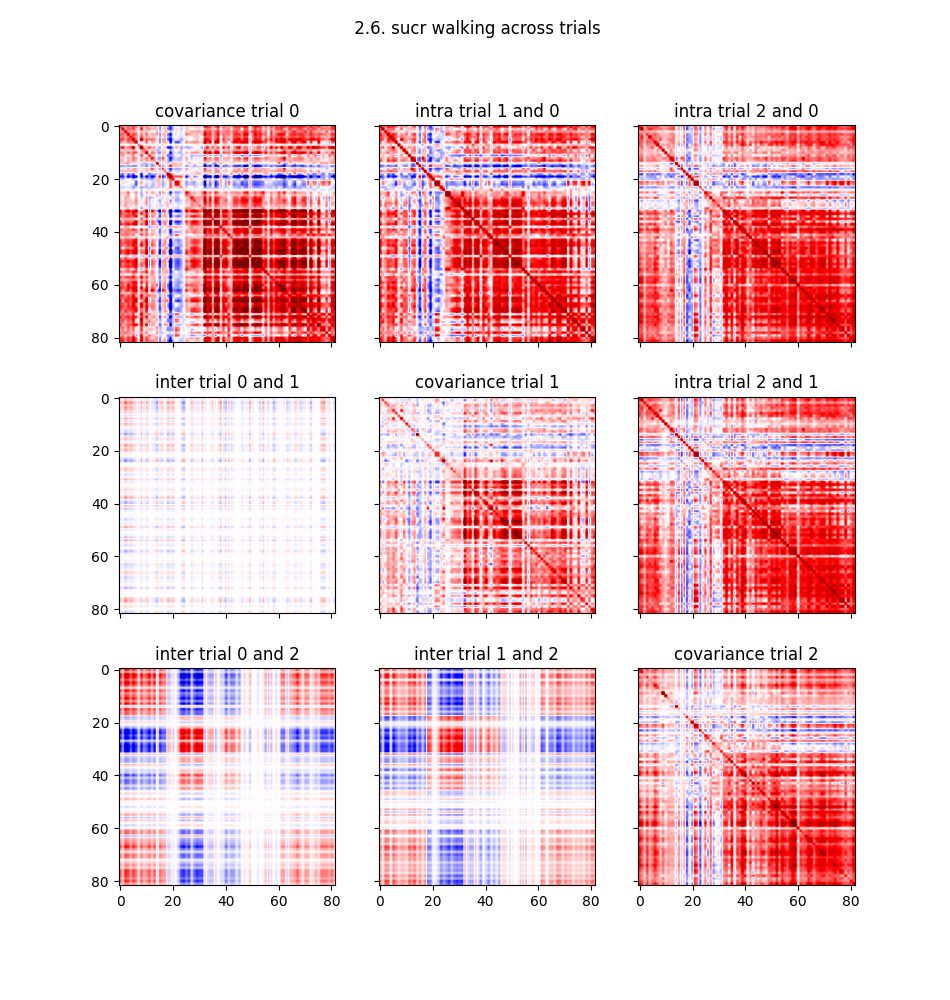

<IPython.core.display.Javascript object>


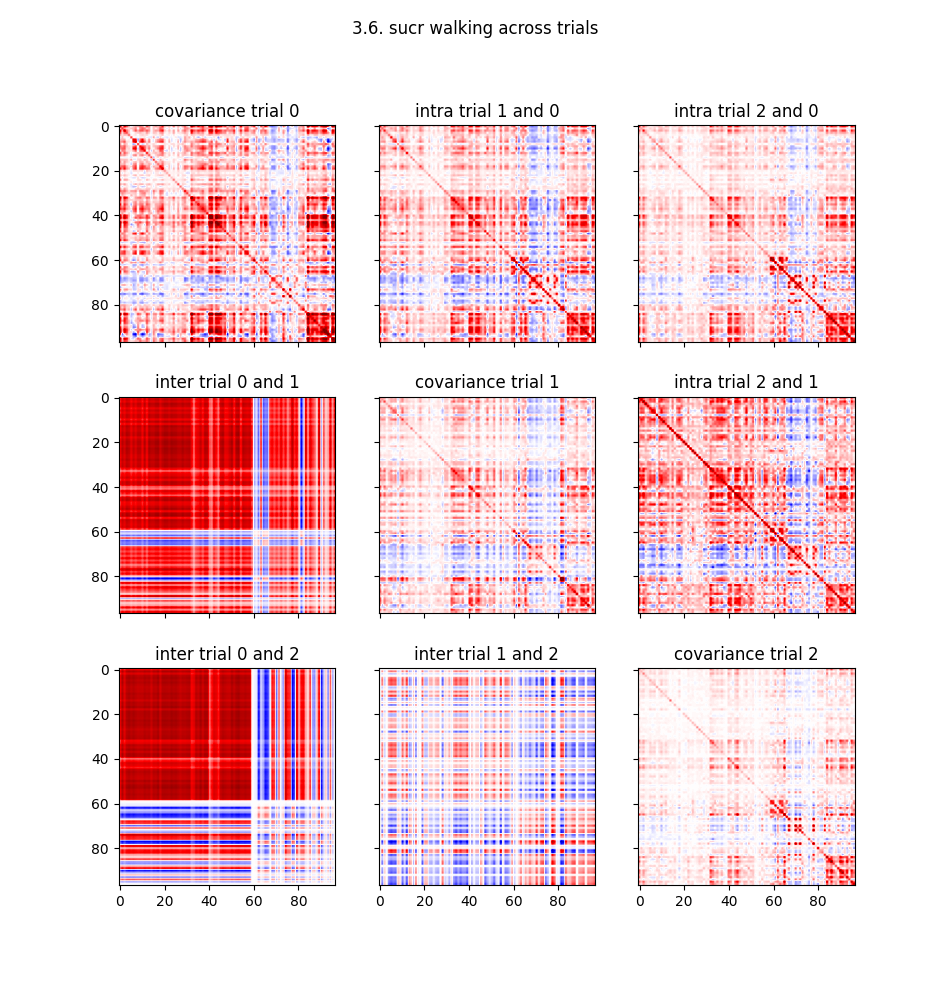

In [341]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_walk, trials=[0,1,2], clim=[-1,1], name=pcan.condition+" walking across trials")

<IPython.core.display.Javascript object>


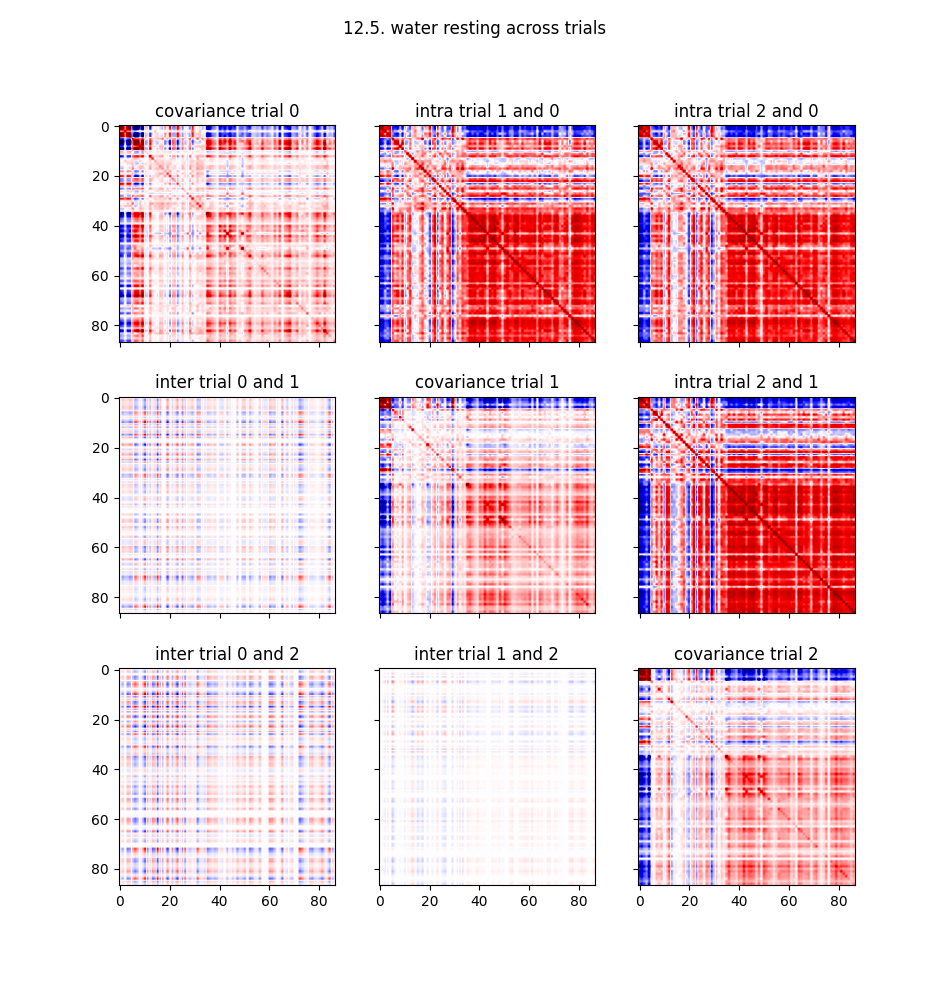

<IPython.core.display.Javascript object>


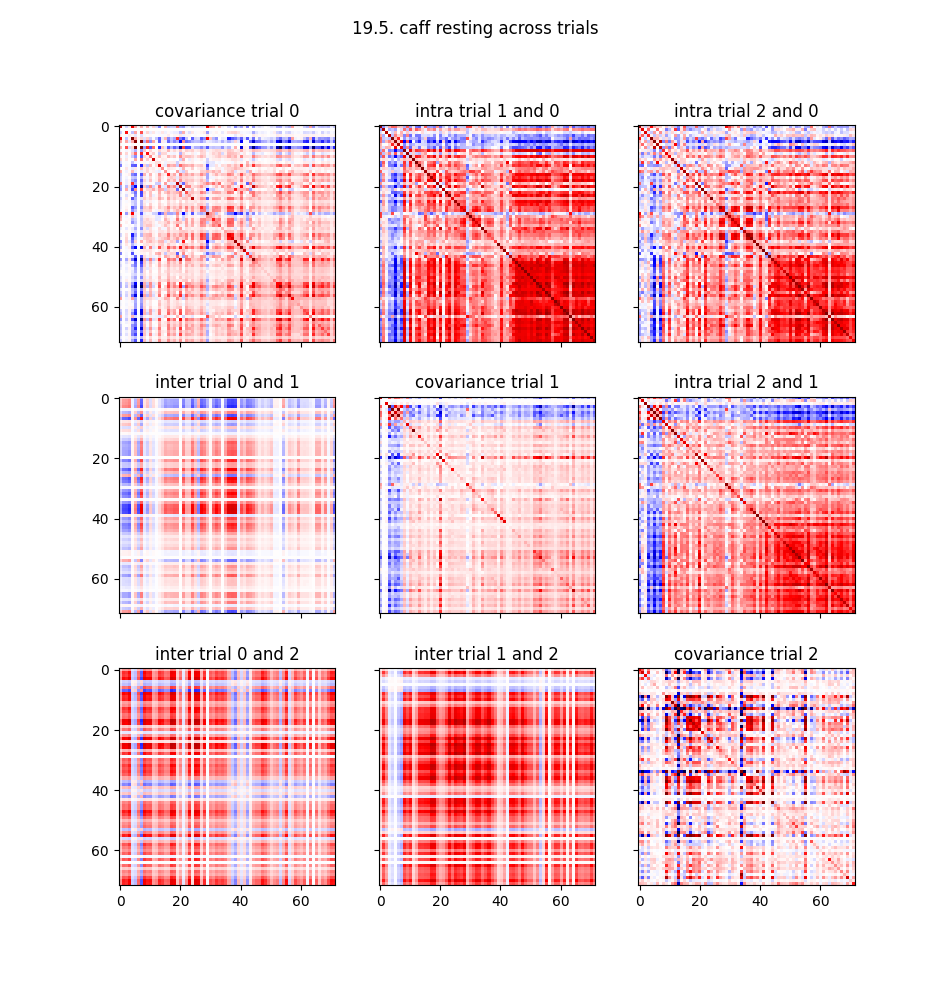

<IPython.core.display.Javascript object>


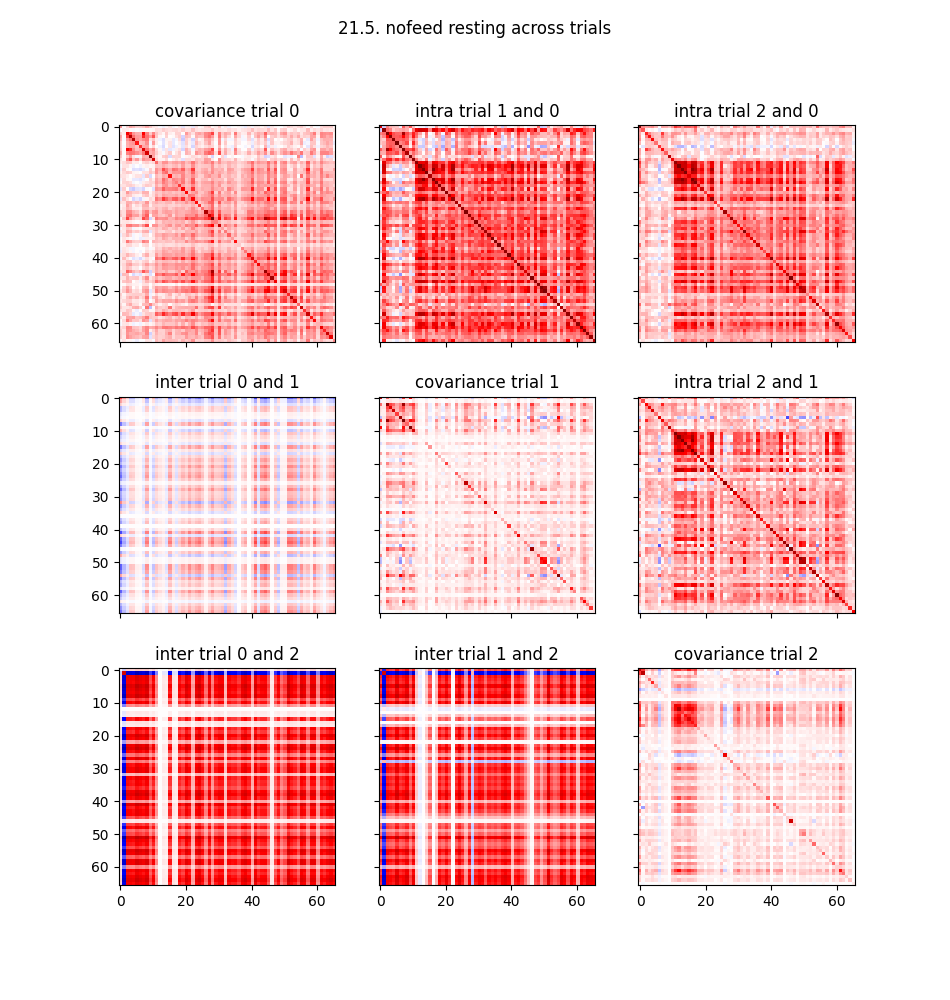

<IPython.core.display.Javascript object>


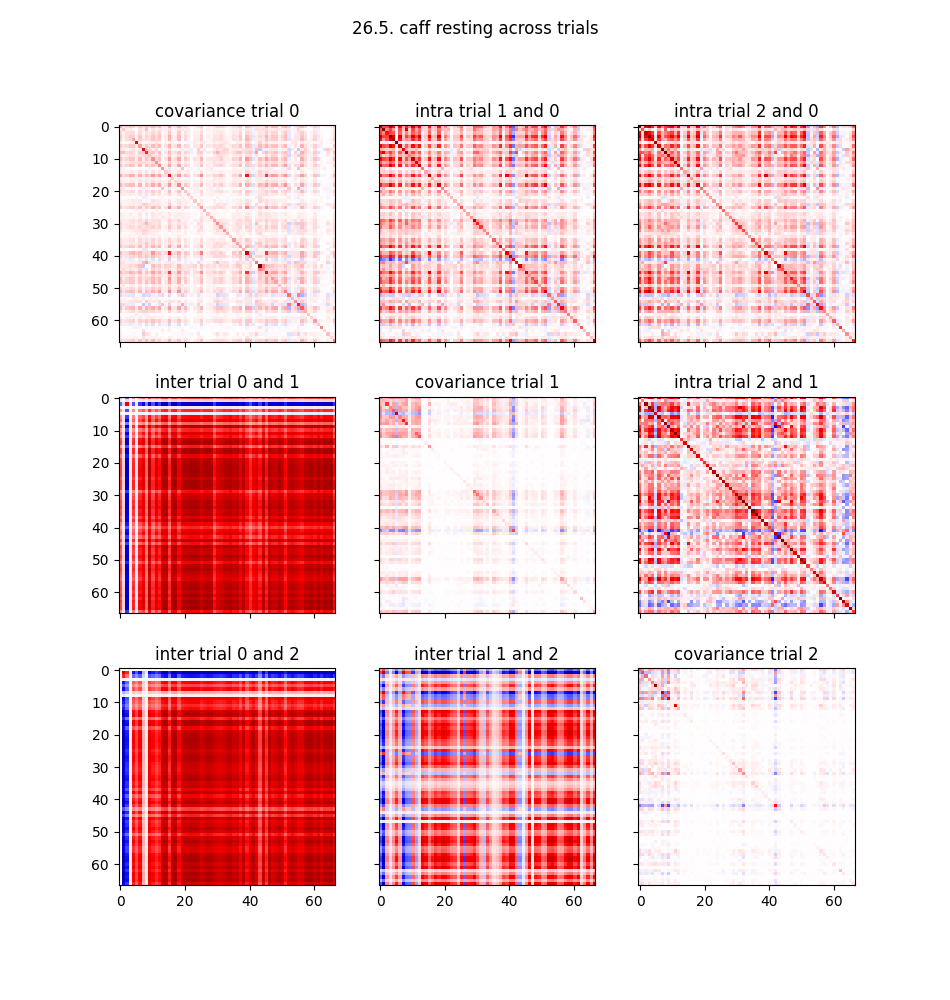

<IPython.core.display.Javascript object>


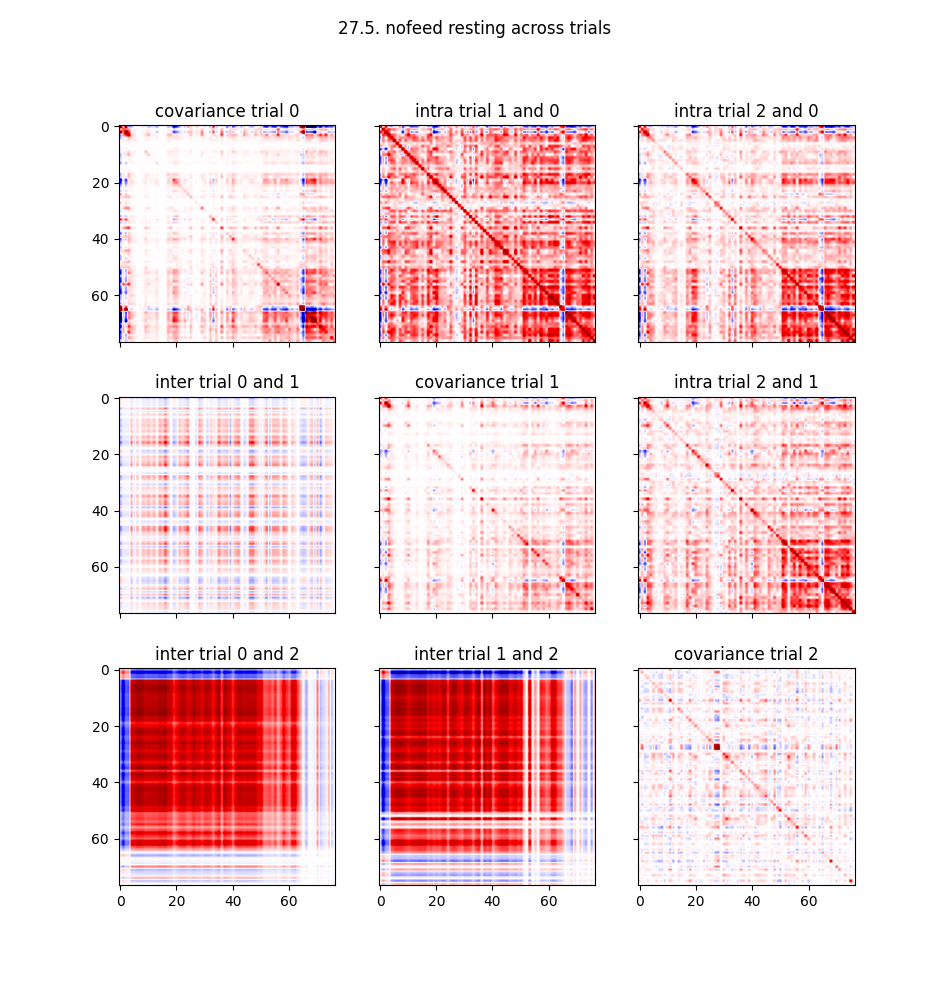

<IPython.core.display.Javascript object>


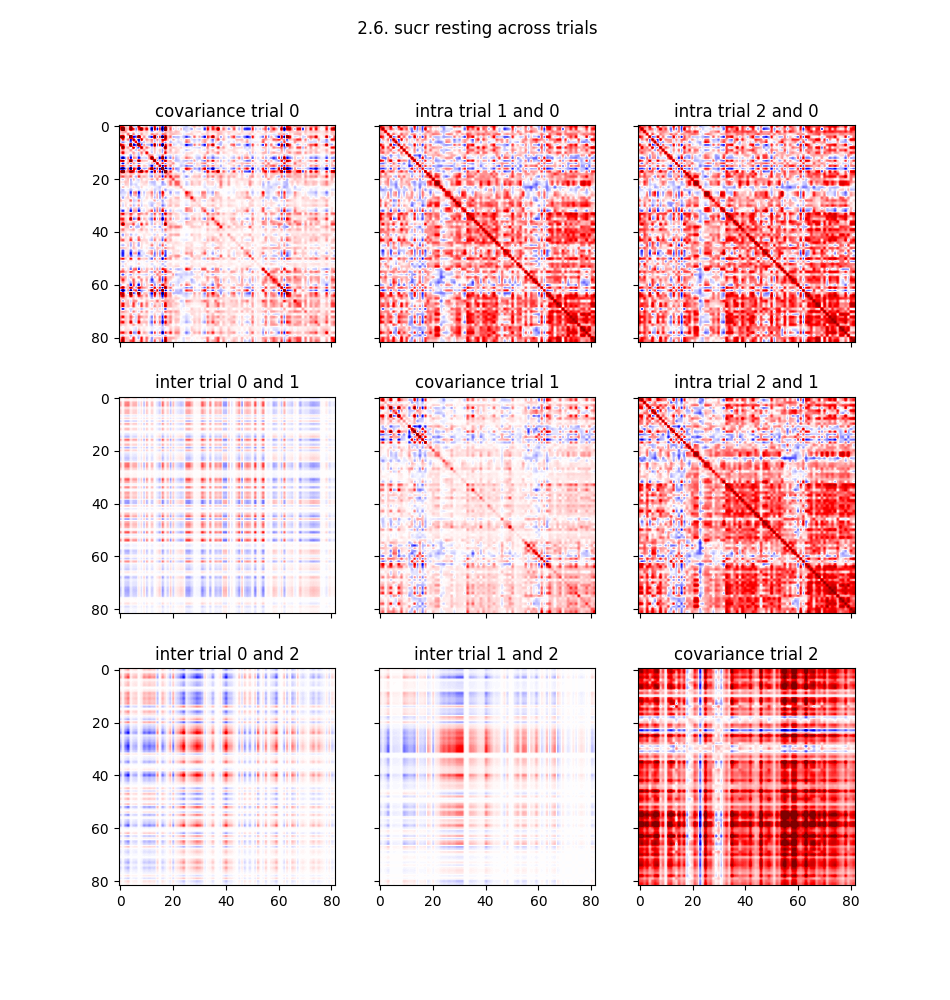

<IPython.core.display.Javascript object>


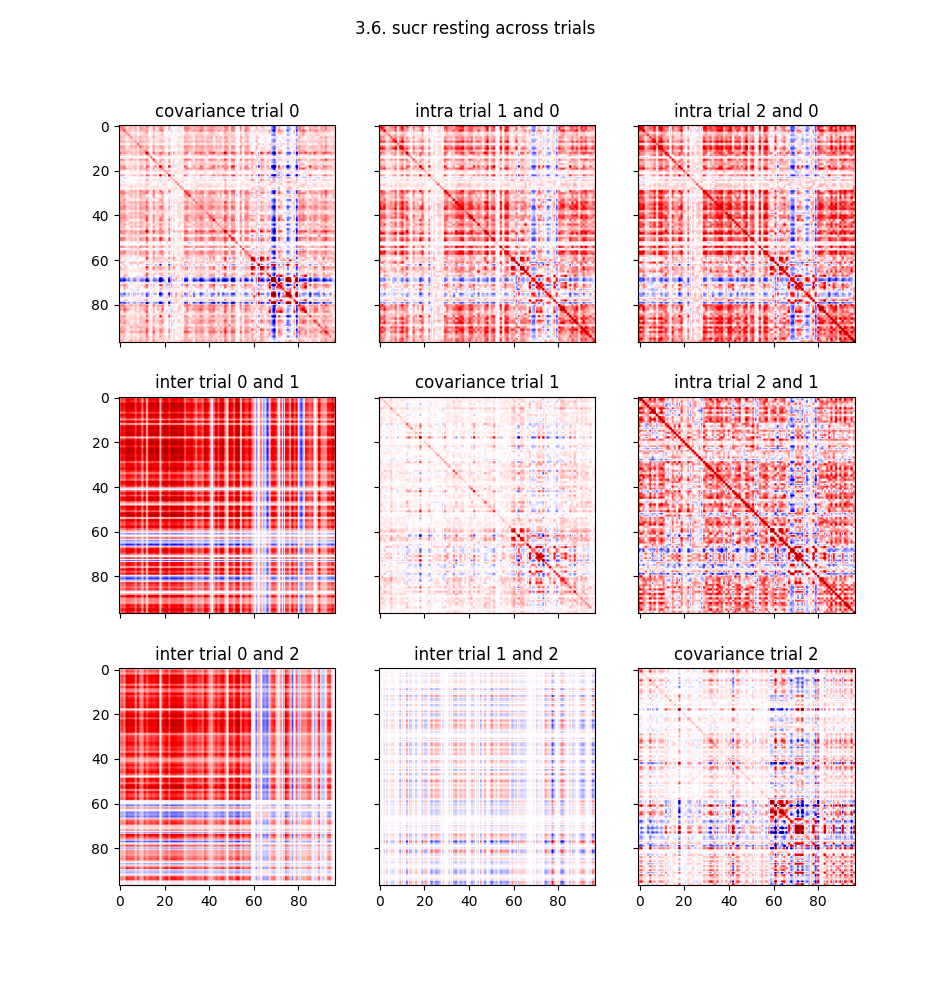

In [342]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_rest, trials=[0,1,2], clim=[-1,1], name=pcan.condition+" resting across trials")

<IPython.core.display.Javascript object>


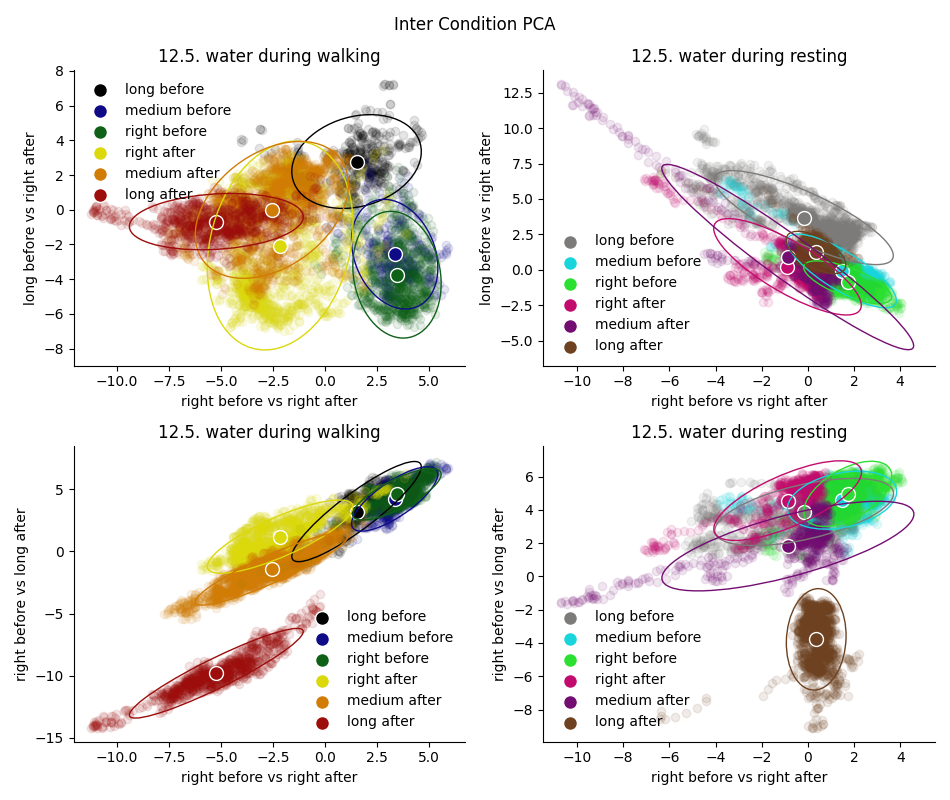

In [364]:
%matplotlib notebook

colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
order = [0,4,1,5,2,3]

fig, axs = plt.subplots(2,2, figsize=(9.5,8))  # , sharex="col", sharey="col")
    
i_fly = 0
pcan = pcans[i_fly]

an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[2,3], w_2=pcan.w_inter_pca_walk_neurons[0,2],
             X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[2,3], w_2=pcan.w_inter_pca_rest_neurons[0,2],
             X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)

an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[2,3], w_2=pcan.w_inter_pca_walk_neurons[2,5],
             X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[2,3], w_2=pcan.w_inter_pca_rest_neurons[2,5],
             X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)

fig.suptitle("Inter Condition PCA")
fig.tight_layout()

<IPython.core.display.Javascript object>


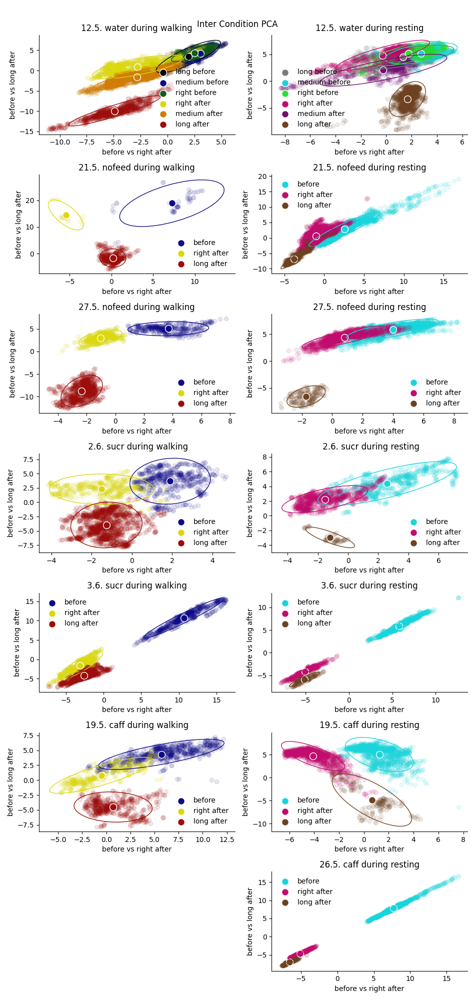

In [365]:
%matplotlib notebook

colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
order = [0,5,1,6, 2,3, 4]

fig, axs = plt.subplots(N_flies,2, figsize=(9.5,20))  # , sharex="col", sharey="col")
for i_fly, pcan in enumerate(pcans):
    i_ax = order[i_fly]
    i0 = 0 if i_fly != 0 else 1
    i1 = 1 if i_fly != 0 else 3
    i2 = 2 if i_fly != 0 else 5
    if i_fly == 0:
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[i0,i1], w_2=pcan.w_inter_pca_walk_neurons[i0,i2],
                     X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[i0,i1], w_2=pcan.w_inter_pca_rest_neurons[i0,i2],
                     X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)
    else:
        if i_fly != 3:
            an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[i0,i1], w_2=pcan.w_inter_pca_walk_neurons[i0,i2],
                         X_trials=pcan.neurons_walk, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                         X_names=["before", "right after", "long after"], 
                         fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors)
        else:
            axs[i_ax, 0].axis("off")
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[i0,i1], w_2=pcan.w_inter_pca_rest_neurons[i0,i2],
                     X_trials=pcan.neurons_rest, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                     X_names=["before", "right after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast)
fig.suptitle("Inter Condition PCA")
fig.tight_layout()

<IPython.core.display.Javascript object>


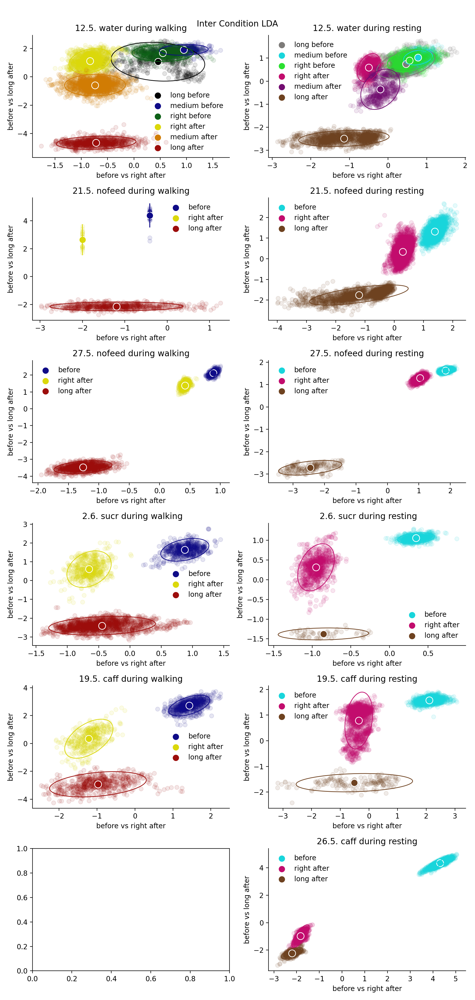

In [133]:
%matplotlib notebook

colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
order = [0,4,1,5,2,3]


fig, axs = plt.subplots(N_flies,2, figsize=(9.5,20))  # , sharex="col", sharey="col")
for i_fly, pcan in enumerate(pcans):
    i_ax = order[i_fly]
    i0 = 0 if i_fly != 0 else 1
    i1 = 1 if i_fly != 0 else 3
    i2 = 2 if i_fly != 0 else 5
    if i_fly == 0:
        an.plot_proj_scatter(w_1=pcan.w_inter_lda_walk_neurons[i0,i1], w_2=pcan.w_inter_lda_walk_neurons[i0,i2],
                     X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
        an.plot_proj_scatter(w_1=pcan.w_inter_lda_rest_neurons[i0,i1], w_2=pcan.w_inter_lda_rest_neurons[i0,i2],
                     X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)
    else:
        if i_fly != 3:
            an.plot_proj_scatter(w_1=pcan.w_inter_lda_walk_neurons[i0,i1], w_2=pcan.w_inter_lda_walk_neurons[i0,i2],
                         X_trials=pcan.neurons_walk, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                         X_names=["before", "right after", "long after"], 
                         fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors)
        an.plot_proj_scatter(w_1=pcan.w_inter_lda_rest_neurons[i0,i1], w_2=pcan.w_inter_lda_rest_neurons[i0,i2],
                     X_trials=pcan.neurons_rest, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                     X_names=["before", "right after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast)
fig.suptitle("Inter Condition LDA")
fig.tight_layout()

# variance ratios

<IPython.core.display.Javascript object>


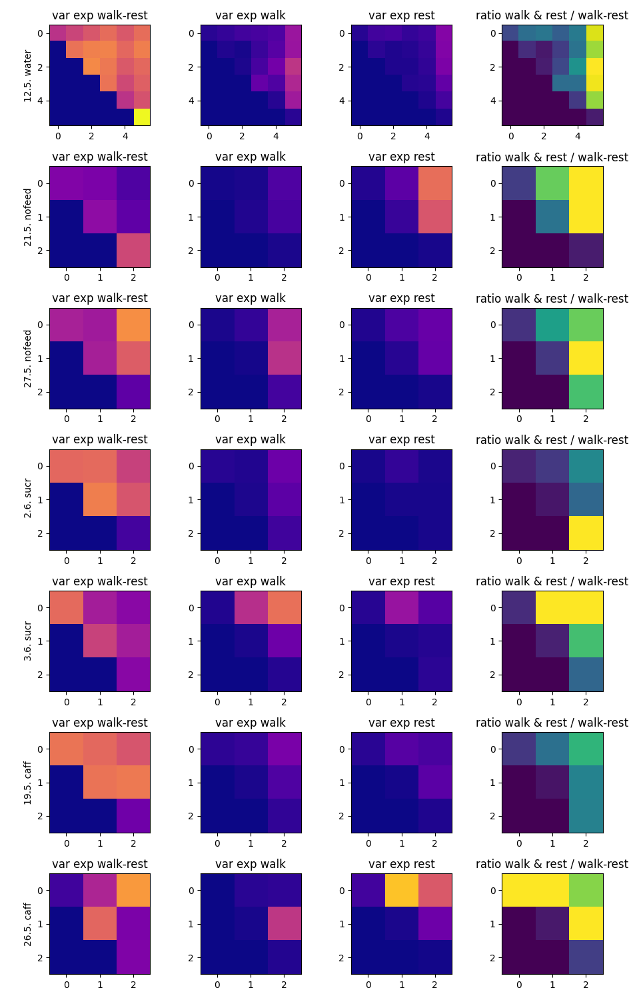

In [350]:
%matplotlib notebook
fig, axs = plt.subplots(N_flies,4, figsize=(9.5,15))  # sharex=True, sharey=True, 
order = [0,5,1,6, 2,3, 4]


for i_fly, pcan in enumerate(pcans):
    axs_ = axs[order[i_fly]]
    axs_[0].imshow(pcan.var_exp_walk_rests_neurons, clim=[0,0.5], cmap=plt.cm.get_cmap("plasma"))
    axs_[0].set_title("var exp walk-rest")
    axs_[0].set_ylabel(pcan.condition)
    axs_[1].imshow(pcan.var_exp_walk_times_neurons, clim=[0,0.5], cmap=plt.cm.get_cmap("plasma"))
    axs_[1].set_title("var exp walk")
    axs_[2].imshow(pcan.var_exp_rest_times_neurons, clim=[0,0.5], cmap=plt.cm.get_cmap("plasma"))
    axs_[2].set_title("var exp rest")
    axs_[3].imshow(pcan.ratios_neurons, clim=[0,1])
    axs_[3].set_title("ratio walk & rest / walk-rest")
fig.tight_layout()

# look at the neurons from the weights

<IPython.core.display.Javascript object>


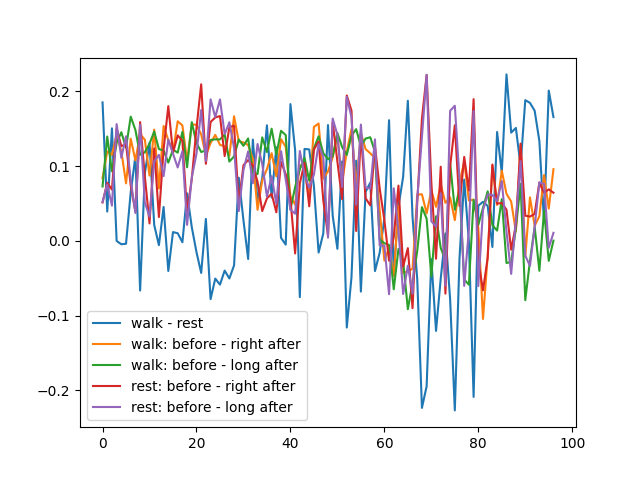

In [351]:
i_fly = 6
pcan = pcans[i_fly]
i0 = 0 if i_fly != 0 else 1
i1 = 1 if i_fly != 0 else 3
i2 = 2 if i_fly != 0 else 5
i_trials = [i0, i1, i2]
i_sort = pcan.neurons_i_sort
walk = [pcan.walk[i_t].astype(np.int8) for i_t in i_trials]
rest = [pcan.rest[i_t].astype(np.int8) for i_t in i_trials]
neurons = [pcan.neurons[i_t] for i_t in i_trials]
trial_names = [pcan.trial_names[i_t] for i_t in i_trials]
condition = pcan.condition
w = pcan.w_inter_pca_walk_rest_neurons
i = np.argsort(w)
w_1_walk = pcan.w_inter_pca_walk_neurons[i0,i1]
i_1_walk = np.argsort(w_1_walk)
w_2_walk = pcan.w_inter_pca_walk_neurons[i0,i2]
i_2_walk = np.argsort(w_2_walk)
w_1_rest = pcan.w_inter_pca_rest_neurons[i0,i1]
i_1_rest = np.argsort(w_1_rest)
w_2_rest = pcan.w_inter_pca_rest_neurons[i0,i2]
i_2_rest = np.argsort(w_2_rest)

%matplotlib notebook
plt.plot(w, label="walk - rest")
plt.plot(w_1_walk, label="walk: before - right after")
plt.plot(w_2_walk, label="walk: before - long after")
plt.plot(w_1_rest, label="rest: before - right after")
plt.plot(w_2_rest, label="rest: before - long after")
plt.legend()

In [83]:
myplt = reload(myplt)

## interesting:<br>
- 210512 water
    - 0: i_2_rest[-2]
    - 11: i_2_rest[1]
    - 69: i_2_walk[-2]
    - 74, 14: i_1_walk[-1, -2]
    - 34: i_1_walk[0]
    - 35, 17: i[-1, -2]
- 210519 caff
    - 39: i[1]
    - 23, 51: i[-1, -2]
    - 67, 21: i_2_walk[-1, -2]
    - 53, 40: i_1_rest[0,1]
- 210521 nofeed
    - .
- 210526 caff
    - 18, 9: i[0,1]
    - 0, 40: i_2_rest[0,1]
- 210527 nofeed
    - 21, 31: i[-1, -2]
    - 27: i_2_walk[-2]
    - 32, 51: i_1_rest[-1,-2]
    - 30: i_walk[-2]
- 210602 sucr
    - 45: i_2_rest[-1]
- 210603 sucr
    - 11,81: i[0,1]
    - 46, 52: i_1_walk[0,1]

<IPython.core.display.Javascript object>


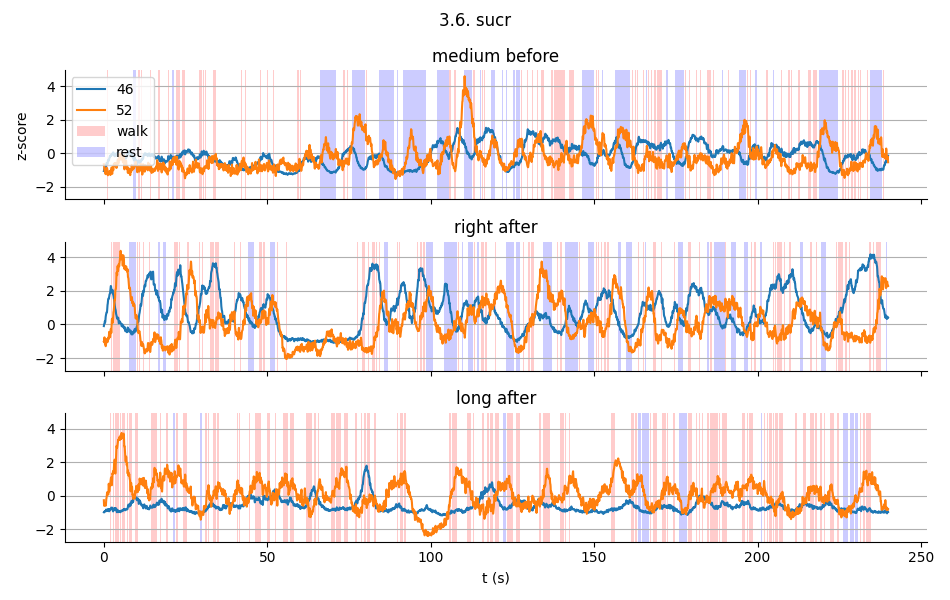

In [354]:
%matplotlib notebook

i_rois = [i_1_walk[0], i_1_walk[1]]  # [i[0], i[1], i[2]]
i_rois_sorted = [np.argwhere(i_sort==i_roi)[0,0] for i_roi in i_rois]
fig, axs = plt.subplots(3,1, figsize=(9.5, 6), sharex=True, sharey=True)
for i_trial, ax in enumerate(axs):
        myplt.shade_walk_rest(x=np.arange(3840)/16, walk=walk[i_trial], rest=rest[i_trial], ax=ax)
        ax.plot(np.arange(3840)/16, neurons[i_trial][:,i_rois], label=i_rois_sorted)
        # ax.plot(np.arange(3840)/16, walk[i_trial]-rest[i_trial], 'k')
        ax.set_title(trial_names[i_trial])
        if i_trial == 0:
            ax.legend()
            ax.set_ylabel("z-score")
        if i_trial == 2:
            ax.set_xlabel("t (s)")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(axis="y")
fig.suptitle(condition)
fig.tight_layout()

# pixelwise analysis

In [355]:
ws = []

for i_fly, pcan in enumerate(pcans):
    if i_fly == 0:
        i_trial = 1
    else:
        i_trial = 0
    w_tmp = pcan.get_w_inter_pca_walk_rest_pixels(i_trials=[0]).reshape(pcan.size_y, -1)
    ws.append(w_tmp)
    """
    abs_im = (np.abs(w) > np.quantile(np.abs(w),0.95)).astype(np.int32)
    abs_im = binary_opening(abs_im, selem=np.ones((3,2)))
    abs_im = binary_closing(abs_im, selem=np.ones((3,2)))
    selected_pixels = abs_im.flatten()
    pcan.select_pixels(selected_pixels)
    pcan.sort_pixels()
    w = pcan.pixels_to_image(pcan.get_w_inter_pca_walk_rest_pixels())
    pcan.get_covs_walk_rest_pixels()
    pcan.get_covs_inter_trial_pixels()
    pcan.get_inter_pca_trials_pixels()
    """

<IPython.core.display.Javascript object>


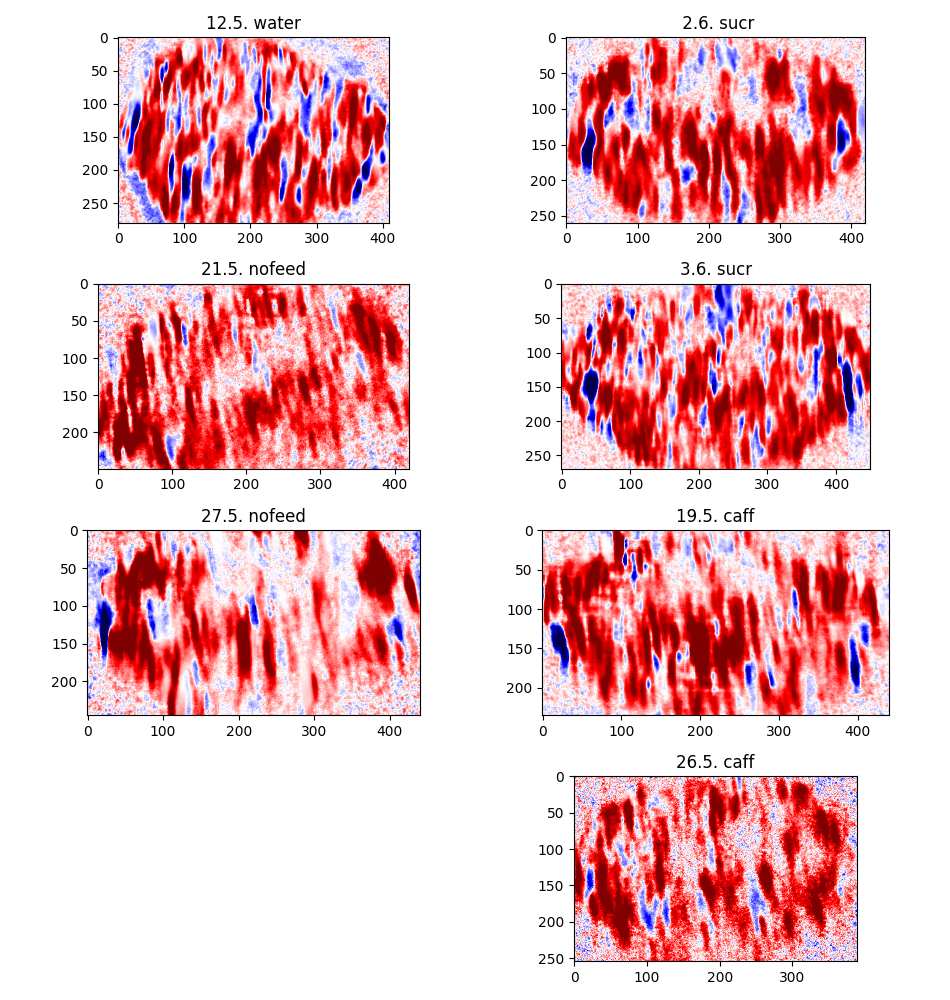

In [385]:
%matplotlib notebook
fig, axs = plt.subplots(4,2, figsize=(9.5, 10))
axs = axs.T.flatten()
axs[3].axis("off")
order = [0,6,1,7, 2,4, 5]

for i_fly, this_w in enumerate(ws):
    i_ax = order[i_fly]
    if i_fly == 0:
        clim = np.quantile(np.abs(this_w), 0.95)
    axs[i_ax].imshow(this_w, cmap=plt.cm.get_cmap("seismic"), clim=[-clim, clim])
    axs[i_ax].set_title(pcans[i_fly].condition)
fig.tight_layout()

<IPython.core.display.Javascript object>


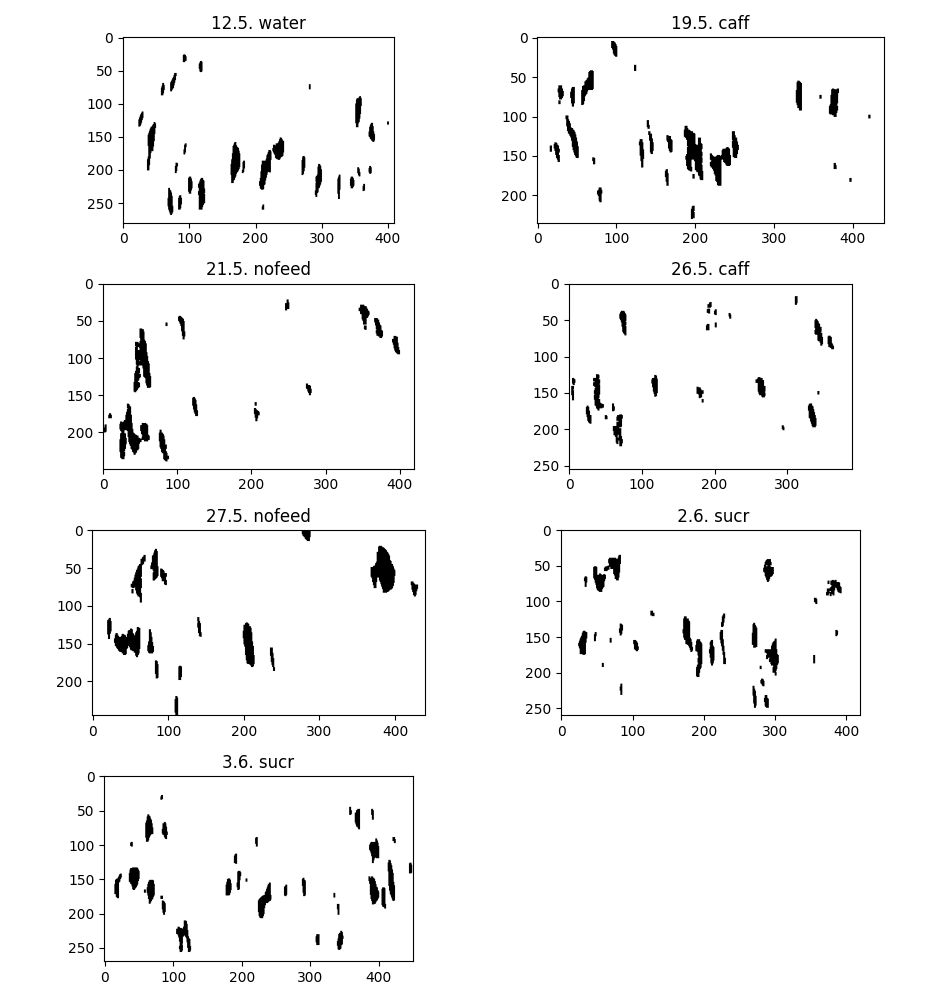

5366
4603
4093
2861
4944
4661
5506


In [358]:
%matplotlib notebook
fig, axs = plt.subplots(4,2, figsize=(9.5, 10))
axs = axs.flatten()
axs[-1].axis("off")
for i_fly, this_w in enumerate(ws):
    abs_im = (np.abs(this_w) > np.quantile(np.abs(this_w),0.95)).astype(np.int32)
    abs_im = binary_opening(abs_im, selem=np.ones((5,3)))
    # abs_im = binary_closing(abs_im, selem=np.ones((5,3)))
    print(np.sum(abs_im))
    axs[i_fly].imshow(abs_im, cmap=plt.cm.get_cmap("Greys"))  # , clim=[-clim, clim])
    axs[i_fly].set_title(pcans[i_fly].condition)
fig.tight_layout()

<IPython.core.display.Javascript object>


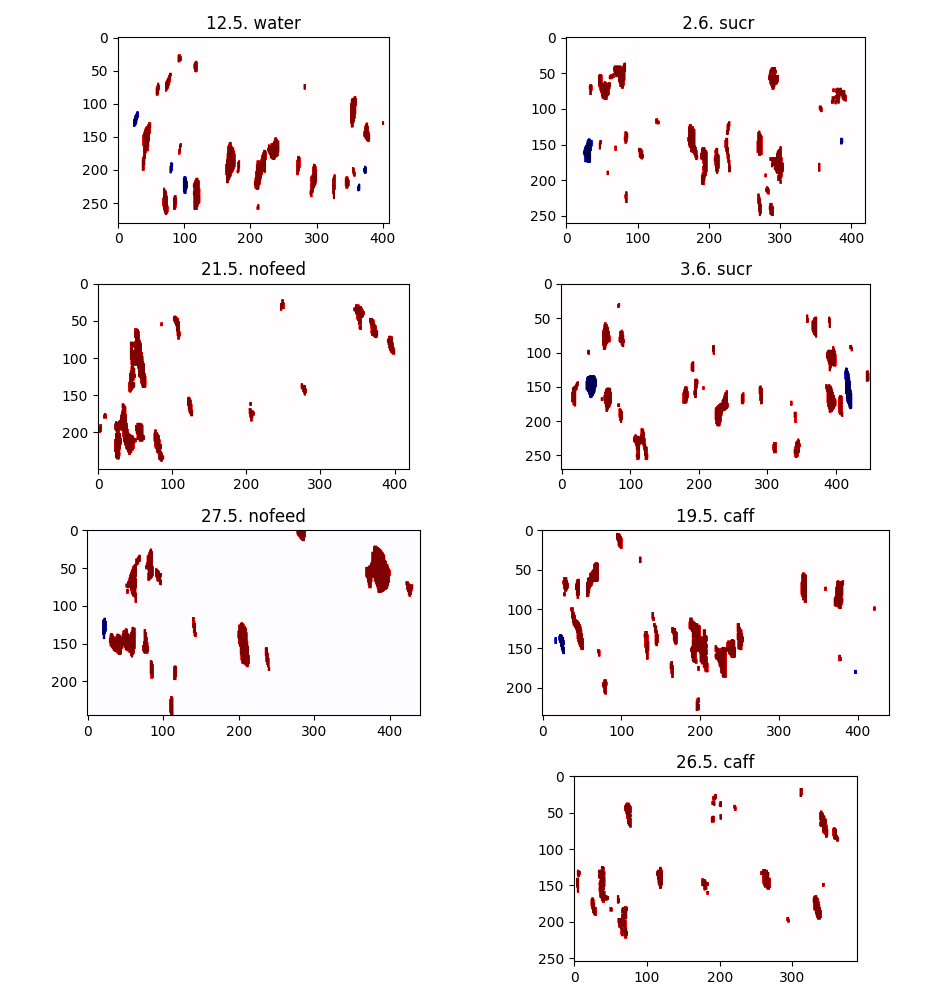

5366
4603
4093
2861
4944
4661
5506


In [384]:
%matplotlib notebook
fig, axs = plt.subplots(4,2, figsize=(9.5, 10))
axs = axs.T.flatten()
axs[3].axis("off")
order = [0,6,1,7, 2,4, 5]
for i_fly, this_w in enumerate(ws):
    i_ax = order[i_fly]
    clim = np.quantile(np.abs(this_w),0.95)
    abs_im = (np.abs(this_w) > np.quantile(np.abs(this_w),0.95)).astype(np.int32)
    abs_im = binary_opening(abs_im, selem=np.ones((5,3)))
    # abs_im = binary_closing(abs_im, selem=np.ones((5,3)))
    print(np.sum(abs_im))
    axs[i_ax].imshow(this_w*abs_im, cmap=plt.cm.get_cmap("seismic"), clim=[-clim, clim])
    axs[i_ax].set_title(pcans[i_fly].condition)
fig.tight_layout()

In [359]:
for pcan in tqdm(pcans):
    if i_fly == 0:
        i_trial = 1
    else:
        i_trial = 0
    w = pcan.get_w_inter_pca_walk_rest_pixels(i_trials=[i_trial]).reshape(pcan.size_y, -1)
    abs_im = (np.abs(w) > np.quantile(np.abs(w),0.95)).astype(np.int32)
    abs_im = binary_opening(abs_im, selem=np.ones((5,3)))
    # abs_im = binary_closing(abs_im, selem=np.ones((3,2)))
    selected_pixels = abs_im.flatten()
    pcan.select_pixels(selected_pixels)
    pcan.sort_pixels()
    w = pcan.pixels_to_image(pcan.get_w_inter_pca_walk_rest_pixels())
    pcan.get_covs_walk_rest_pixels()
    pcan.get_covs_inter_trial_pixels()
    pcan.get_inter_pca_trials_pixels()
    pcan.get_inter_condition_variance_ratios_pixels()


100%|██████████| 7/7 [06:57<00:00, 59.69s/it] 


<IPython.core.display.Javascript object>


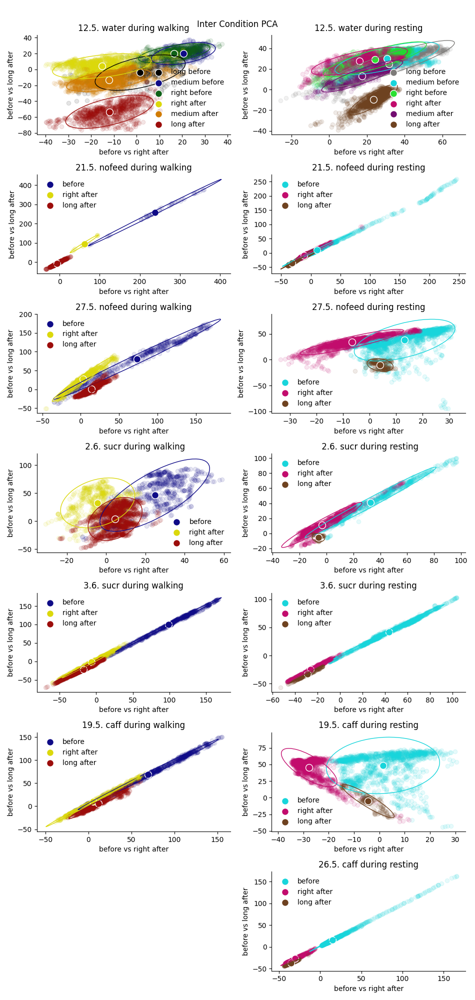

In [360]:
%matplotlib notebook

colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
order = [0,5,1,6, 2,3, 4]

fig, axs = plt.subplots(N_flies,2, figsize=(9.5,20))  # , sharex="col", sharey="col")
for i_fly, pcan in enumerate(pcans):
    i_ax = order[i_fly]
    i0 = 0 if i_fly != 0 else 1
    i1 = 1 if i_fly != 0 else 3
    i2 = 2 if i_fly != 0 else 5
    if i_fly == 0:
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_pixels[i0,i1], w_2=pcan.w_inter_pca_walk_pixels[i0,i2],
                     X_trials=pcan.pixels_walk, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_pixels[i0,i1], w_2=pcan.w_inter_pca_rest_pixels[i0,i2],
                     X_trials=pcan.pixels_rest, trials=[0,1,2,3,4,5], w_names=["before vs right after", "before vs long after"],
                     X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)
    else:
        if i_fly != 3:
            an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_pixels[i0,i1], w_2=pcan.w_inter_pca_walk_pixels[i0,i2],
                         X_trials=pcan.pixels_walk, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                         X_names=["before", "right after", "long after"], 
                         fig=fig, ax=axs[i_ax,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors)
        else:
            axs[i_ax, 0].axis("off")
        an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_pixels[i0,i1], w_2=pcan.w_inter_pca_rest_pixels[i0,i2],
                     X_trials=pcan.pixels_rest, trials=[i0,i1,i2], w_names=["before vs right after", "before vs long after"],
                     X_names=["before", "right after", "long after"], 
                     fig=fig, ax=axs[i_ax,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast)
fig.suptitle("Inter Condition PCA")
fig.tight_layout()

<IPython.core.display.Javascript object>


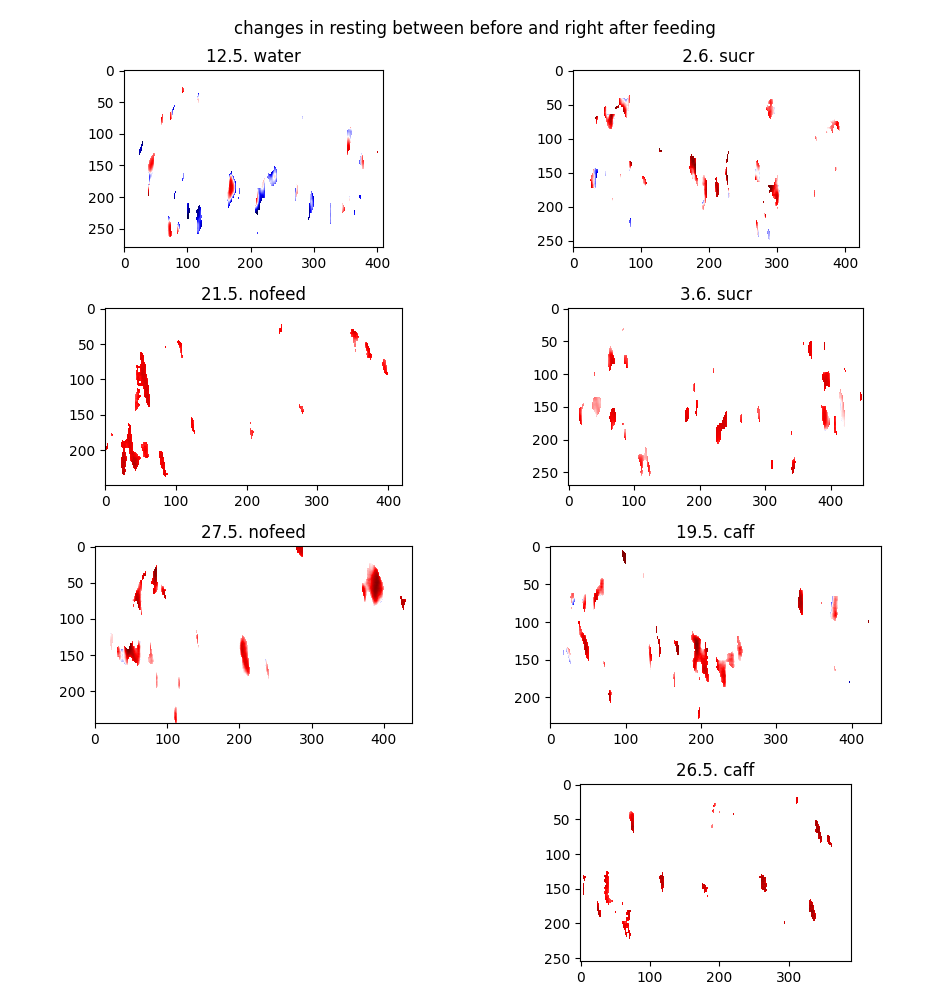

In [380]:
%matplotlib notebook
fig, axs = plt.subplots(4,2, figsize=(9.5, 10))
axs = axs.T.flatten()
axs[3].axis("off")
order = [0,6,1,7, 2,4, 5]

for i_fly, pcan in enumerate(pcans):
    i_ax = order[i_fly]
    i0 = 0 if i_fly != 0 else 1
    i1 = 1 if i_fly != 0 else 3
    i2 = 2 if i_fly != 0 else 5
    this_w = pcan.pixels_to_image(pcan.w_inter_pca_walk_pixels[i0,i2])
    if i_fly == 0:
        # clim = np.quantile(np.abs(this_w), 0.95)
        clim = 0.03
        
    axs[i_ax].imshow(this_w, cmap=plt.cm.get_cmap("seismic"), clim=[-clim, clim])
    axs[i_ax].set_title(pcans[i_fly].condition)
fig.suptitle("changes in resting between before and right after feeding")
fig.tight_layout()

## PCA explainer

In [243]:
x = np.concatenate([np.random.normal(-1.75,1,1000), np.random.normal(1.75,1,1000)])
y = np.concatenate([np.random.normal(0,4,1000), np.random.normal(0,4,1000)])
data = np.array([x,y]).T

In [244]:
phi = np.pi/6
R = np.array([[np.cos(phi), -np.sin(phi)],[np.sin(phi), np.cos(phi)]])

In [245]:
data_r = data.dot(R)

<IPython.core.display.Javascript object>


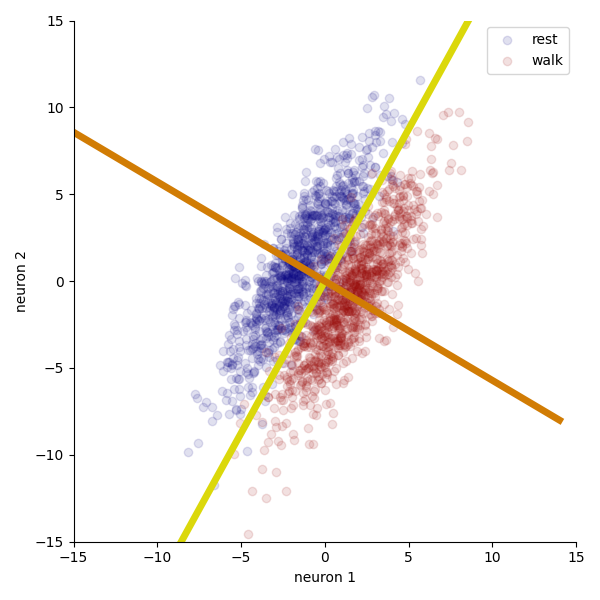

In [231]:
%matplotlib notebook

option = 3

fig, ax = plt.subplots(1,1,figsize=(6,6))
if option < 2:
    ax.scatter(data_r[:,0], data_r[:,1], color=colors[0], alpha=0.125)
else:
    ax.scatter(data_r[:1000,0], data_r[:1000,1], color=colors[0], alpha=0.125, label="rest")
    ax.scatter(data_r[1000:,0], data_r[1000:,1], color=colors[2], alpha=0.125, label="walk")
    ax.legend()
if option >= 1:
    x = np.arange(-15,15)
    ax.plot(x, 1.75*x, color=colors[1], linewidth=5)
if option >= 3:
    ax.plot(x, -1/1.75*x, color=colors_long[4], linewidth=5)

plt.xlabel("neuron 1")
plt.ylabel("neuron 2")
plt.ylim([-15,15])
plt.xlim([-15,15])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig.tight_layout()

<IPython.core.display.Javascript object>


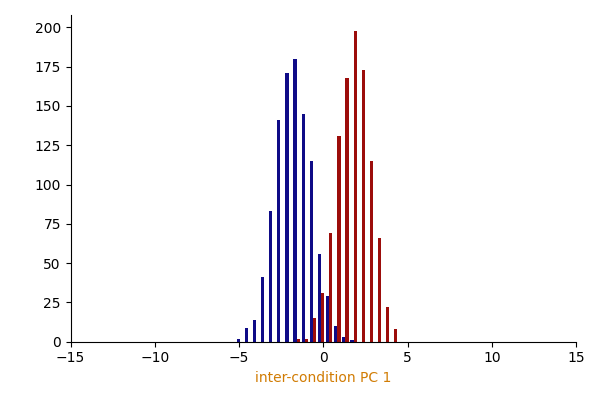

In [256]:
fig, ax = plt.subplots(1,1,figsize=(6,4))

option = 3
if option == 1:
    ax.hist(y, bins=20, color=colors[0])
    ax.set_xlabel("PC 1")
elif option == 2:
    ax.hist([y[:1000], y[1000:]], bins=20, color=[colors[0], colors[2]])
    ax.set_xlabel("PC 1")
elif option == 3:
    ax.hist([x[:1000], x[1000:]], bins=20, color=[colors[0], colors[2]])
    ax.set_xlabel("inter-condition PC 1", color=colors_long[4])
ax.set_xlim([-15,15])
ax.set_ylabel(" ")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig.tight_layout()

## difference walking resting

In [257]:
i_fly = 0
pcan = pcans[i_fly]
w = pcan.get_w_inter_pca_walk_rest_neurons(i_trials=[1])

In [269]:
w_pca = -1 * an.pca(np.concatenate([pcan.neurons_rest[1], pcan.neurons_walk[1]]), n=1).flatten()

<IPython.core.display.Javascript object>


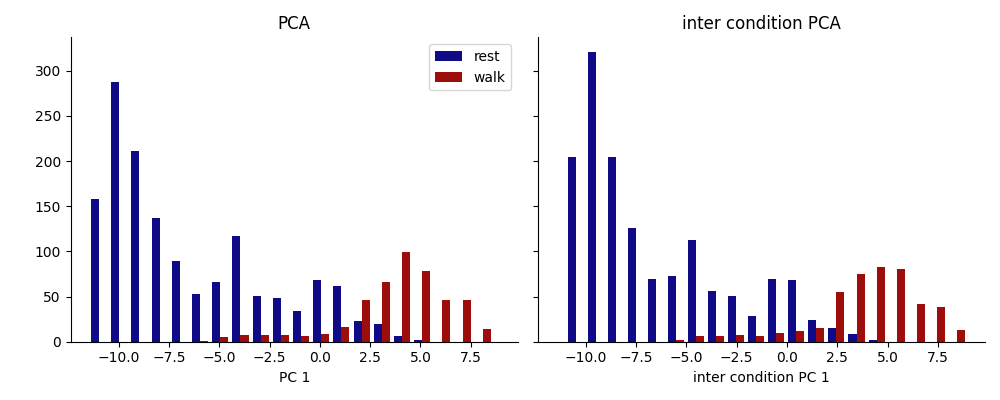

In [273]:
%matplotlib notebook
fig, axs = plt.subplots(1,2,figsize=(10,4), sharex=True, sharey=True)
axs[0].hist([pcan.neurons_rest[1].dot(w_pca), pcan.neurons_walk[1].dot(w_pca)], bins=20, color=[colors[0], colors[2]], label=["rest", "walk"])
axs[0].legend()

axs[1].hist([pcan.neurons_rest[1].dot(w), pcan.neurons_walk[1].dot(w)], bins=20, color=[colors[0], colors[2]])
axs[0].set_title("PCA")

axs[1].set_title("inter condition PCA")
axs[0].set_xlabel("PC 1")
axs[1].set_xlabel("inter condition PC 1")
axs[0].set_ylabel(" ")
axs[0].spines["top"].set_visible(False)
axs[0].spines["right"].set_visible(False)
axs[1].spines["top"].set_visible(False)
axs[1].spines["right"].set_visible(False)
fig.tight_layout()

<IPython.core.display.Javascript object>


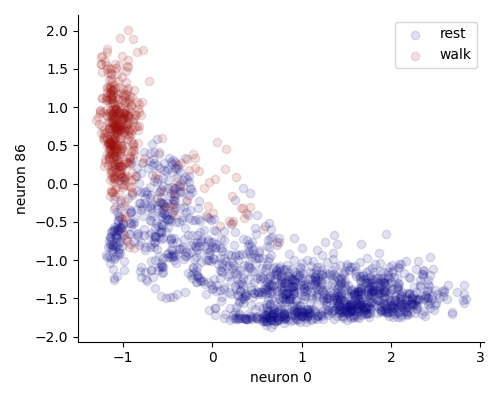

In [288]:
%matplotlib notebook
fig, ax = plt.subplots(1,1,figsize=(5,4))

ax.scatter(pcan.neurons_rest[1][:,0], pcan.neurons_rest[1][:,-1], color=colors[0], alpha=0.125, label="rest")
ax.scatter(pcan.neurons_walk[1][:,0], pcan.neurons_walk[1][:,-1], color=colors[2], alpha=0.125, label="walk")
ax.legend()

plt.xlabel("neuron 0")
plt.ylabel("neuron 86")
# plt.ylim([-15,15])
# plt.xlim([-15,15])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
fig.tight_layout()


<IPython.core.display.Javascript object>


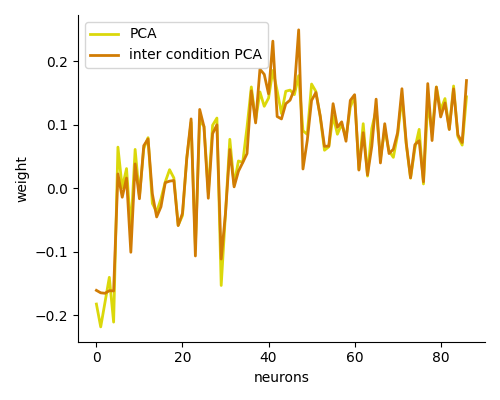

In [286]:
%matplotlib notebook
fig, ax = plt.subplots(1,1,figsize=(5,4), sharex=True, sharey=True)
ax.plot(w_pca, color=colors[1], label="PCA", linewidth=2)
ax.plot(w, color=colors_long[4], label="inter condition PCA", linewidth=2)
ax.legend()
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.set_xlabel("neurons")
ax.set_ylabel("weight")
fig.tight_layout()

In [330]:
cov_X, cov_X1, cov_X2, cov_intra, cov_inter = an.cov_pair(data_r[:1000], data_r[1000:], zscore=True)

<IPython.core.display.Javascript object>


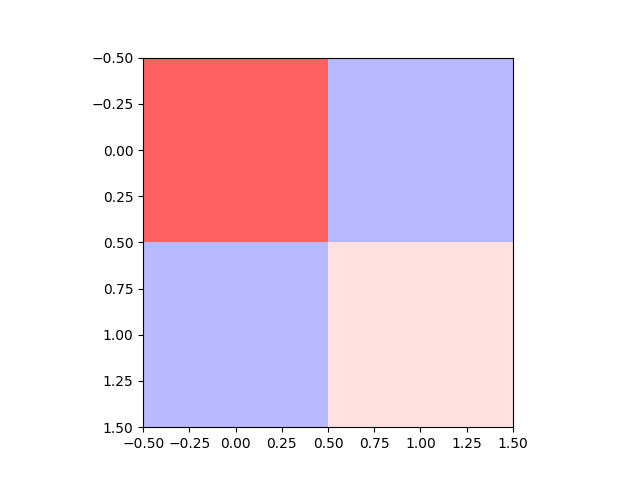

In [333]:
%matplotlib notebook
plt.imshow(cov_inter, clim=[-1,1], cmap=plt.cm.get_cmap("seismic"))